In [2]:
from nba_api.stats.endpoints import playercareerstats
from nba_api.stats.static import players
import pandas as pd

# 1. 找到球员ID
player_dict = players.find_players_by_full_name('LeBron James')[0]
player_id = player_dict['id']
print(f"LeBron James 的 player_id 是: {player_id}")

# 2. 拉所有赛季的数据
career = playercareerstats.PlayerCareerStats(player_id=player_id)
season_totals = career.get_data_frames()[0]

# 3. 看一下
print(season_totals.head())

# 4. 保存到本地
season_totals.to_csv('lebron_james_season_stats.csv', index=False)

print("LeBron James所有赛季数据保存成功！")


LeBron James 的 player_id 是: 2544
   PLAYER_ID SEASON_ID LEAGUE_ID     TEAM_ID TEAM_ABBREVIATION  PLAYER_AGE  \
0       2544   2003-04        00  1610612739               CLE        19.0   
1       2544   2004-05        00  1610612739               CLE        20.0   
2       2544   2005-06        00  1610612739               CLE        21.0   
3       2544   2006-07        00  1610612739               CLE        22.0   
4       2544   2007-08        00  1610612739               CLE        23.0   

   GP  GS   MIN  FGM  ...  FT_PCT  OREB  DREB  REB  AST  STL  BLK  TOV   PF  \
0  79  79  3120  622  ...   0.754    99   333  432  465  130   58  273  149   
1  80  80  3388  795  ...   0.750   111   477  588  577  177   52  262  146   
2  79  79  3361  875  ...   0.738    75   481  556  521  123   66  260  181   
3  78  78  3190  772  ...   0.698    83   443  526  470  125   55  250  171   
4  75  74  3027  794  ...   0.712   133   459  592  539  138   81  255  165   

    PTS  
0  1654  
1  

In [3]:
import pandas as pd

# 1. 读取原来的 players.csv
players_df = pd.read_csv('players.csv')

# 2. 提取 'name' 列
names_df = players_df[['name']]

# 3. 重命名为 'player_name'
names_df = names_df.rename(columns={'name': 'player_name'})

# 4. 保存到新的 CSV 文件
names_df.to_csv('player_names.csv', index=False)

print("提取并重命名完成！新的CSV叫 player_names.csv")


提取并重命名完成！新的CSV叫 player_names.csv


In [5]:
from nba_api.stats.endpoints import playercareerstats
from nba_api.stats.static import players
import pandas as pd
import time
import os

# 1. 读取 player_names.csv
names_df = pd.read_csv('player_names.csv')

# 2. 检查是否已有保存文件
output_file = 'all_players_season_stats.csv'

# Define column names based on the expected data fields from the API response
column_names = [
    'SEASON_ID', 'LEAGUE_ID', 'TEAM_ID', 'TEAM_ABBREVIATION', 'PLAYER_ID', 
    'AGE', 'GP', 'GS', 'MIN', 'FGM', 'FGA', 'FG_PCT', 'FG3M', 'FG3A', 
    'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST', 'STL', 
    'BLK', 'TO', 'PF', 'PTS', 'PLAYER_NAME'
]

# If file does not exist, create it and write the header row
if not os.path.exists(output_file):
    pd.DataFrame(columns=column_names).to_csv(output_file, index=False)

# 3. 循环每个名字
for idx, row in names_df[3900:].iterrows():
    player_name = row['player_name']
    print(f"正在处理: {player_name}, idx {idx}")

    # 查找球员ID
    search_result = players.find_players_by_full_name(player_name)
    if len(search_result) == 0:
        print(f"⚠️ 找不到 {player_name}，跳过！")
        continue

    player_id = search_result[0]['id']
    
    # 拉取球员赛季数据
    try:
        career = playercareerstats.PlayerCareerStats(player_id=player_id)
        season_totals = career.get_data_frames()[0]
        
        if not season_totals.empty:
            season_totals['PLAYER_NAME'] = player_name  # 标记是谁

            # Write data to file, appending it without headers if file already exists
            if os.path.getsize(output_file) == 0:
                season_totals.to_csv(output_file, mode='a', index=False, header=True)
            else:
                season_totals.to_csv(output_file, mode='a', index=False, header=False)

            print(f"✅ 成功保存 {player_name} 的数据！")
        
        time.sleep(0.2)  # 防止请求太频繁
    except Exception as e:
        print(f"❌ 拉取 {player_name} 数据失败: {e}")
        continue

print("🏁 所有处理完成！")


正在处理: Joe Smyth, idx 3900
✅ 成功保存 Joe Smyth 的数据！
正在处理: Tony Snell, idx 3901
✅ 成功保存 Tony Snell 的数据！
正在处理: Eric Snow, idx 3902
✅ 成功保存 Eric Snow 的数据！
正在处理: Dick Snyder, idx 3903
✅ 成功保存 Dick Snyder 的数据！
正在处理: Kirk Snyder, idx 3904
✅ 成功保存 Kirk Snyder 的数据！
正在处理: Chips Sobek, idx 3905
⚠️ 找不到 Chips Sobek，跳过！
正在处理: Ricky Sobers, idx 3906
✅ 成功保存 Ricky Sobers 的数据！
正在处理: Ron Sobie, idx 3907
✅ 成功保存 Ron Sobie 的数据！
正在处理: Mike Sojourner, idx 3908
✅ 成功保存 Mike Sojourner 的数据！
正在处理: Willie Sojourner, idx 3909
⚠️ 找不到 Willie Sojourner，跳过！
正在处理: Will Solomon, idx 3910
✅ 成功保存 Will Solomon 的数据！
正在处理: Willie Somerset, idx 3911
✅ 成功保存 Willie Somerset 的数据！
正在处理: Darius Songaila, idx 3912
✅ 成功保存 Darius Songaila 的数据！
正在处理: Dave Sorenson, idx 3913
✅ 成功保存 Dave Sorenson 的数据！
正在处理: James Southerland, idx 3914
✅ 成功保存 James Southerland 的数据！
正在处理: Gino Sovran, idx 3915
✅ 成功保存 Gino Sovran 的数据！
正在处理: Pape Sow, idx 3916
✅ 成功保存 Pape Sow 的数据！
正在处理: Ken Spain, idx 3917
⚠️ 找不到 Ken Spain，跳过！
正在处理: Ray Spalding, idx 3918
✅ 成功保存 Ray

KeyboardInterrupt: 

In [6]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'all_players_season_stats.csv'
df = pd.read_csv(input_file)

# 将 PLAYER_NAME 移动到第一列
columns = ['PLAYER_NAME'] + [col for col in df.columns if col != 'PLAYER_NAME']
df = df[columns]

# 按照 PLAYER_NAME 和 LEAGUE_ID 排序
df = df.sort_values(by=['PLAYER_NAME', 'LEAGUE_ID'])

# 保存修改后的数据到新的 CSV 文件
output_file = 'all_players_season_stats.csv'
df.to_csv(output_file, index=False)

print(f"数据处理完成，已保存到 {output_file}")


数据处理完成，已保存到 all_players_season_stats.csv


In [11]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'all_players_season_stats.csv'
df = pd.read_csv(input_file)

# 查找所有列数据完全相同的行
duplicate_rows = df[df.duplicated()]

# 如果有重复行，打印它们
if not duplicate_rows.empty:
    print("发现以下重复的行：")
    print(duplicate_rows)
else:
    print("没有发现重复的行。")


没有发现重复的行。


In [10]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'all_players_season_stats.csv'
df = pd.read_csv(input_file)

# 删除完全重复的行
df_no_duplicates = df.drop_duplicates()

# 保存处理后的数据到新的 CSV 文件
output_file = 'all_players_season_stats.csv'
df_no_duplicates.to_csv(output_file, index=False)

print(f"重复的行已删除，处理后的数据已保存到 {output_file}")


重复的行已删除，处理后的数据已保存到 all_players_season_stats.csv


In [2]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'all_players_season_stats.csv'
df = pd.read_csv(input_file)

# 列出要进行求和的列
sum_columns = ['GP', 'GS', 'MIN', 'FGM', 'FGA', 'FG_PCT', 'FG3M', 'FG3A', 
               'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 
               'AST', 'STL', 'BLK', 'TO', 'PF', 'PTS']

# 按照 PLAYER_NAME 和 LEAGUE_ID 对数据进行分组，并求和
grouped_df = df.groupby(['PLAYER_NAME', 'LEAGUE_ID'], as_index=False)[sum_columns].sum()

# 取出 AGE 列，保持原来的值 (这里我们取每组第一个数据的 AGE)
grouped_df['AGE'] = df.groupby(['PLAYER_NAME', 'LEAGUE_ID'], as_index=False)['AGE'].first()['AGE']
print(grouped_df)

# 保存处理后的数据到新的 CSV 文件
output_file = 'processed_players_season_stats.csv'
grouped_df.to_csv(output_file, index=False)

print(f"数据处理完成，已保存到 {output_file}")


        PLAYER_NAME LEAGUE_ID   GP    GS     MIN  FGM   FGA  FG_PCT   FG3M  \
0     A.J. Bramlett   1999-00    8   0.0    61.0    4    21   0.190    0.0   
1      Aaron Brooks   2007-08   51   0.0   608.0   93   225   0.413   36.0   
2      Aaron Brooks   2008-09   80  35.0  1998.0  316   783   0.404  113.0   
3      Aaron Brooks   2009-10   82  82.0  2919.0  575  1331   0.432  209.0   
4      Aaron Brooks   2010-11  118  24.0  2568.0  440  1174   1.151  140.0   
...             ...       ...  ...   ...     ...  ...   ...     ...    ...   
4828    Zelmo Beaty   1965-66   80   0.0  3072.0  616  1301   0.473    0.0   
4829    Zelmo Beaty   1966-67   48   0.0  1661.0  328   694   0.473    0.0   
4830    Zelmo Beaty   1967-68   82   0.0  3068.0  639  1310   0.488    0.0   
4831    Zelmo Beaty   1968-69   72   0.0  2578.0  588  1251   0.470    0.0   
4832    Zelmo Beaty   1974-75   69   0.0  1213.0  136   310   0.439    0.0   

       FG3A  ...  OREB   DREB     REB  AST   STL   BLK     TO  

In [8]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'all_players_season_stats.csv'
df = pd.read_csv(input_file)

# 查找所有重复的行
duplicates = df[df.duplicated()]

# 如果有重复行，打印第一个重复的行及其索引
if not duplicates.empty:
    # 找到第一个重复行
    first_duplicate_index = duplicates.index[0]
    first_duplicate_row = df.iloc[first_duplicate_index]

    # 查找与该行重复的索引
    duplicate_indexes = df[df.eq(first_duplicate_row).all(axis=1)].index.tolist()

    print(f"第一个重复行的索引: {first_duplicate_index}")
    print("第一个重复的行数据：")
    print(first_duplicate_row)

    print("\n与该行重复的其他行的索引：")
    print(duplicate_indexes)
else:
    print("没有发现重复的行。")


第一个重复行的索引: 509
第一个重复的行数据：
PLAYER_NAME          Bill Bradley
SEASON_ID                   76233
LEAGUE_ID                 1967-68
TEAM_ID                         0
TEAM_ABBREVIATION      1610612752
PLAYER_ID                     NYK
AGE                          24.0
GP                             45
GS                            NaN
MIN                         874.0
FGM                           142
FGA                           341
FG_PCT                      0.416
FG3M                          NaN
FG3A                          NaN
FG3_PCT                       NaN
FTM                            76
FTA                           104
FT_PCT                      0.731
OREB                          NaN
DREB                          NaN
REB                         113.0
AST                           137
STL                           NaN
BLK                           NaN
TO                            NaN
PF                            138
PTS                           360
Name: 509, dtype: obje

In [1]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'all_players_season_stats.csv'
df = pd.read_csv(input_file)

# 统计唯一的球员个数
unique_players_count = df['PLAYER_NAME'].nunique()

print(f"数据中共有 {unique_players_count} 个不同的球员")



A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/traitlets/config/application.py", line 10

AttributeError: _ARRAY_API not found


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/traitlets/config/application.py", line 10

AttributeError: _ARRAY_API not found

数据中共有 876 个不同的球员


In [4]:
import pandas as pd

# 读取数据
df = pd.read_csv("salaries_1985to2018.csv")
players = pd.read_csv("players.csv")

# 清洗薪资数据
df['salary'] = pd.to_numeric(df['salary'], errors='coerce')
df = df.dropna(subset=['salary'])

# 合并球员信息
merged = df.merge(players, left_on='player_id', right_on='_id', how='left')
merged = merged.sort_values(['player_id', 'season_start'])
merged['career_year'] = merged.groupby('player_id').cumcount() + 1

# ---- 身高英寸转换 ----
def convert_height(height_str):
    try:
        feet, inches = height_str.split('-')
        return int(feet) * 12 + int(inches)
    except:
        return None

merged['height_inch'] = merged['height'].apply(convert_height)

# ---- 体重数值提取 ----
merged['weight_num'] = merged['weight'].str.replace('lb', '', regex=False).astype(float)

# ---- 清洗 draft_pick 字段 ----
def clean_draft_pick(draft_pick):
    try:
        # 提取数字部分
        pick = ''.join(filter(str.isdigit, draft_pick))
        return int(pick) if pick else None
    except:
        return None

# 处理 draft_pick 字段
merged['draft_pick'] = merged['draft_pick'].apply(clean_draft_pick)
print(merged)
merged.to_csv('player_career_salary.csv')

       index_x league  player_id   salary   season  season_end  season_start  \
0            0    NBA  abdelal01   395000  1990-91        1991          1990   
1            1    NBA  abdelal01   494000  1991-92        1992          1991   
2            2    NBA  abdelal01   500000  1992-93        1993          1992   
3            3    NBA  abdelal01   805000  1993-94        1994          1993   
4            4    NBA  abdelal01   650000  1994-95        1995          1994   
...        ...    ...        ...      ...      ...         ...           ...   
14158    14158    NBA  zipsepa01   750000  2016-17        2017          2016   
14159    14159    NBA  zipsepa01  1312611  2017-18        2018          2017   
14160    14160    NBA  zizican01  1645200  2017-18        2018          2017   
14161    14161    NBA  zubaciv01  1034956  2016-17        2017          2016   
14162    14162    NBA  zubaciv01  1312611  2017-18        2018          2017   

                         team  index_y 

In [18]:
input_file = 'player_career_salary.csv'
df = pd.read_csv(input_file, index_col=False)
# 删除 Unnamed: 0 列
df = df.drop(columns=['Unnamed: 0'])



# 将 PLAYER_NAME 移动到第一列
columns = ['name'] + [col for col in df.columns if col != 'name']
df = df[columns]

# 按照 PLAYER_NAME 和 LEAGUE_ID 排序
df = df.sort_values(by=['name', 'season'])

# 打印前几行
print(df.head())
df.to_csv('player_career_salary.csv',index=False)

         name   salary   season  season_end  season_start                team  \
0  A.C. Green   128750  1985-86        1986          1985  Los Angeles Lakers   
1  A.C. Green   218750  1987-88        1988          1987  Los Angeles Lakers   
2  A.C. Green   269000  1988-89        1989          1988  Los Angeles Lakers   
3  A.C. Green  1500000  1989-90        1990          1989  Los Angeles Lakers   
4  A.C. Green  1750000  1990-91        1991          1990  Los Angeles Lakers   

         _id        birthDate        birthPlace  career_AST  ...  \
0  greenac01  October 4, 1963  Portland, Oregon         1.1  ...   
1  greenac01  October 4, 1963  Portland, Oregon         1.1  ...   
2  greenac01  October 4, 1963  Portland, Oregon         1.1  ...   
3  greenac01  October 4, 1963  Portland, Oregon         1.1  ...   
4  greenac01  October 4, 1963  Portland, Oregon         1.1  ...   

           draft_team draft_year height  \
0  Los Angeles Lakers     1985.0    6-9   
1  Los Angeles Lak

In [20]:
import pandas as pd

# 读取处理后的球员赛季数据文件
processed_file = 'processed_players_season_stats.csv'
processed_df = pd.read_csv(processed_file)

# 读取球员工资数据文件
salary_file = 'player_career_salary.csv'
salary_df = pd.read_csv(salary_file)

# 合并两个数据集，根据 PLAYER_NAME 和 LEAGUE_ID 匹配
merged_df = pd.merge(processed_df, salary_df[['name', 'season', 'salary']], 
                     left_on=['PLAYER_NAME', 'LEAGUE_ID'], 
                     right_on=['name', 'season'], 
                     how='left')

# 删除不需要的辅助列（如果有的话）
merged_df.drop(columns=['name', 'season'], inplace=True)

# 重命名 salary 列为 year_salary
merged_df.rename(columns={'salary': 'year_salary'}, inplace=True)

print(merged_df.head(3))

# # 保存合并后的数据到新的 CSV 文件
output_file = 'processed_players_season_stats.csv'
merged_df.to_csv(output_file, index=False)

print(f"数据处理完成，已保存到 {output_file}")


     PLAYER_NAME LEAGUE_ID  GP    GS     MIN  FGM  FGA  FG_PCT   FG3M   FG3A  \
0  A.J. Bramlett   1999-00   8   0.0    61.0    4   21   0.190    0.0    0.0   
1   Aaron Brooks   2007-08  51   0.0   608.0   93  225   0.413   36.0  109.0   
2   Aaron Brooks   2008-09  80  35.0  1998.0  316  783   0.404  113.0  309.0   

   ...   DREB    REB  AST   STL  BLK     TO   PF  PTS   AGE  year_salary  
0  ...   10.0   22.0    0   1.0  0.0    3.0   13    8  23.0     118974.0  
1  ...   43.0   56.0   87  13.0  5.0   44.0   69  264  23.0     972720.0  
2  ...  124.0  157.0  238  46.0  8.0  125.0  152  894  24.0    1045560.0  

[3 rows x 25 columns]
数据处理完成，已保存到 processed_players_season_stats.csv


In [21]:
import pandas as pd

# 读取 CSV 文件
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 删除 year_salary 列为空的行
df = df.dropna(subset=['year_salary'])


# 保存处理后的数据到新的 CSV 文件（如果需要）
output_file = 'processed_players_season_stats.csv'
df.to_csv(output_file, index=False)

In [22]:
import pandas as pd

# 读取原始的 CSV 文件
input_file = 'processed_players_season_stats.csv'
df = pd.read_csv(input_file)

# 统计唯一的球员个数
unique_players_count = df['PLAYER_NAME'].nunique()

print(f"数据中共有 {unique_players_count} 个不同的球员")


数据中共有 511 个不同的球员


In [25]:
import pandas as pd

# 读取 CSV 文件
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 统计每个球员的不同 LEAGUE_ID 数量
league_count = df.groupby('PLAYER_NAME')['LEAGUE_ID'].nunique()

# 过滤出 LEAGUE_ID 数量大于等于 7 的球员
players_with_many_leagues = league_count[league_count >= 6]

# 统计符合条件的球员个数
num_players = len(players_with_many_leagues)

print(f"有至少 6 个不同 LEAGUE_ID 的球员个数: {num_players}")


有至少 6 个不同 LEAGUE_ID 的球员个数: 217


In [26]:
import pandas as pd

# 读取 CSV 文件
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 将缺失值填充为 0
df = df.fillna(0)

# 查看填充后的数据（可选）

# 可选择保存修改后的 DataFrame 到新的 CSV 文件
df.to_csv('processed_players_season_stats.csv', index=False)


len eligible_players 220
每个簇的球员数量：
Cluster
2    55
1    48
3    38
6    30
5    26
4    23
Name: count, dtype: int64


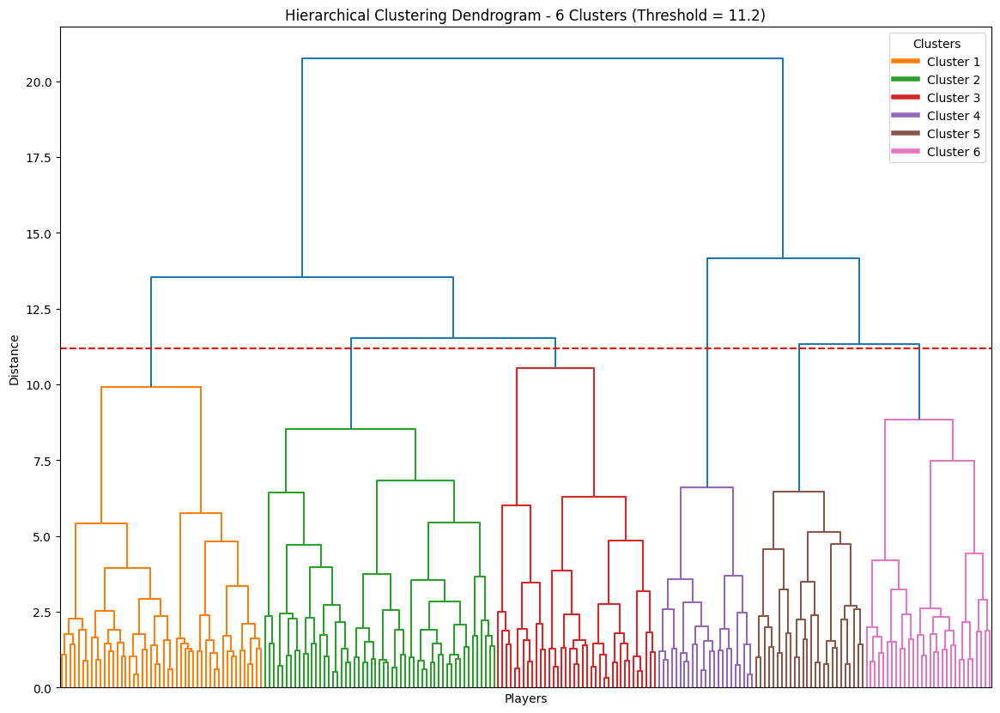

In [212]:
# hier 6 clusters
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 读取数据
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 选择需要进行聚类的列
columns_for_clustering = [
    'FGM', 'FG_PCT', 'FG3M', 'FG3_PCT', 'FTM', 'FT_PCT', 'OREB', 'DREB', 
    'REB', 'AST', 'STL', 'BLK', 'PTS', 'year_salary'
]

# 过滤出打了6年及以上的球员
player_counts = df['PLAYER_NAME'].value_counts()
eligible_players = player_counts[player_counts >= 6].index
df_filtered = df[df['PLAYER_NAME'].isin(eligible_players)]

print('len eligible_players', len(eligible_players))
# 计算每个球员的每个属性归一化并计算L2范数
scaler = MinMaxScaler()

# 用一个字典存储每个球员的6年长向量
player_vectors = {}

for player in eligible_players:
    # 获取该球员的6年数据（按年份排序）
    player_data = df_filtered[df_filtered['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    if len(player_data) >= 6:  # 确保该球员有6年数据
        # 提取前6年的数据
        player_data = player_data.iloc[:6][columns_for_clustering]
        
        # 对每个属性进行归一化
        player_data_normalized = scaler.fit_transform(player_data)
        
        # 计算L2范数，得到一个6年的向量
        l2_norm_vector = np.linalg.norm(player_data_normalized, axis=1)
        
        # 存储每个球员的L2范数向量
        player_vectors[player] = l2_norm_vector

# 1. 整理数据
# 将每个球员的6年L2范数向量存储到DataFrame中
vectors_list = []
players = []

for player, vector in player_vectors.items():
    # 记录球员名字
    players.append(player)
    # 将6年L2范数向量合并为一个向量
    vectors_list.append(vector)

# 创建一个DataFrame，列为6个年限的L2范数
df_vectors = pd.DataFrame(vectors_list)

# 2. 标准化
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_vectors)

# 3. 层次聚类
Z = linkage(df_scaled, method='ward')

# 设置距离阈值
distance_threshold = 11.2
clusters = fcluster(Z, t=distance_threshold, criterion='distance')

# 4. 打印每个簇的球员数量
df_clusters = pd.DataFrame({
    'Player': players,
    'Cluster': clusters
})

cluster_counts = df_clusters['Cluster'].value_counts()
print("每个簇的球员数量：")
print(cluster_counts)

# 5. 绘制树状图
plt.figure(figsize=(14, 10))
dendro = dendrogram(
    Z,
    labels=df_clusters['Player'].values,
    leaf_rotation=90,
    leaf_font_size=8,
    color_threshold=distance_threshold,
    no_labels=True  # 不画名字
)

plt.title(f"Hierarchical Clustering Dendrogram - 6 Clusters (Threshold = {distance_threshold})")
plt.xlabel("Players")
plt.ylabel("Distance")
plt.axhline(y=distance_threshold, c='red', linestyle='--')

# 绘制图例
from matplotlib.lines import Line2D

cluster_colors = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6']
cluster_labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 'Cluster 6']

legend_elements = [
    Line2D([0], [0], color=color, lw=4, label=label)
    for color, label in zip(cluster_colors, cluster_labels)
]

plt.legend(handles=legend_elements, title='Clusters', loc='upper right', fontsize=10)
plt.savefig("hier_6_dendro.jpg")
plt.show()


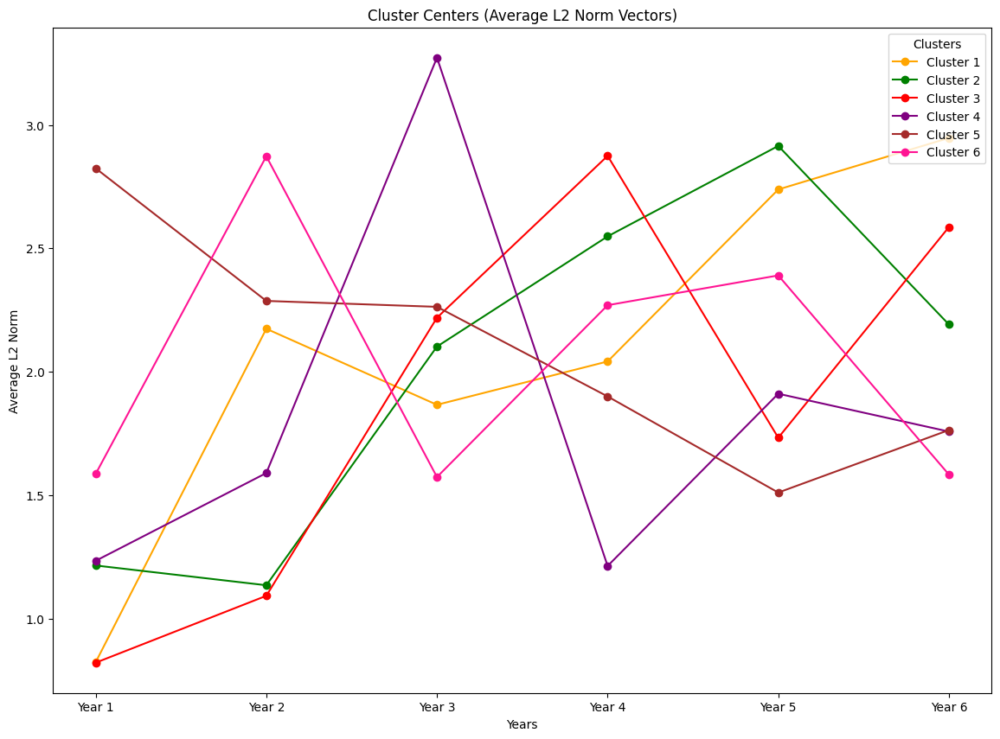

In [213]:
# hier 6 clusters
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 计算每个簇的聚类中心：即每个簇内所有球员的L2范数向量的平均值
cluster_centers = {}
for cluster_id in np.unique(clusters):
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取每个球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])
    
    # 计算该簇的聚类中心（平均L2范数向量）
    cluster_centers[cluster_id] = np.mean(cluster_vectors, axis=0)

# 定义每个簇的颜色
cluster_colors = {
    1: 'orange',  # Cluster 1 -> 橙色
    2: 'green',   # Cluster 2 -> 绿色
    3: 'red',     # Cluster 3 -> 红色
    4: 'purple',   # Cluster 4 -> 紫色
    5: 'brown',     
    6: 'DeepPink'   
}

# 绘制每个簇的聚类中心的折线图
plt.figure(figsize=(14, 10))

# 设置x轴（表示每一年的L2范数）
years = [f'Year {i+1}' for i in range(6)]

# 绘制每个簇的聚类中心，并指定颜色
for cluster_id, center_vector in cluster_centers.items():
    plt.plot(years, center_vector, label=f'Cluster {cluster_id}', marker='o', color=cluster_colors.get(cluster_id, 'black'))

# 添加图例和标签
plt.title("Cluster Centers (Average L2 Norm Vectors)")
plt.xlabel("Years")
plt.ylabel("Average L2 Norm")
plt.legend(title="Clusters", loc="upper right")
plt.savefig("hier_6_center.jpg")

# 显示图形
plt.show()


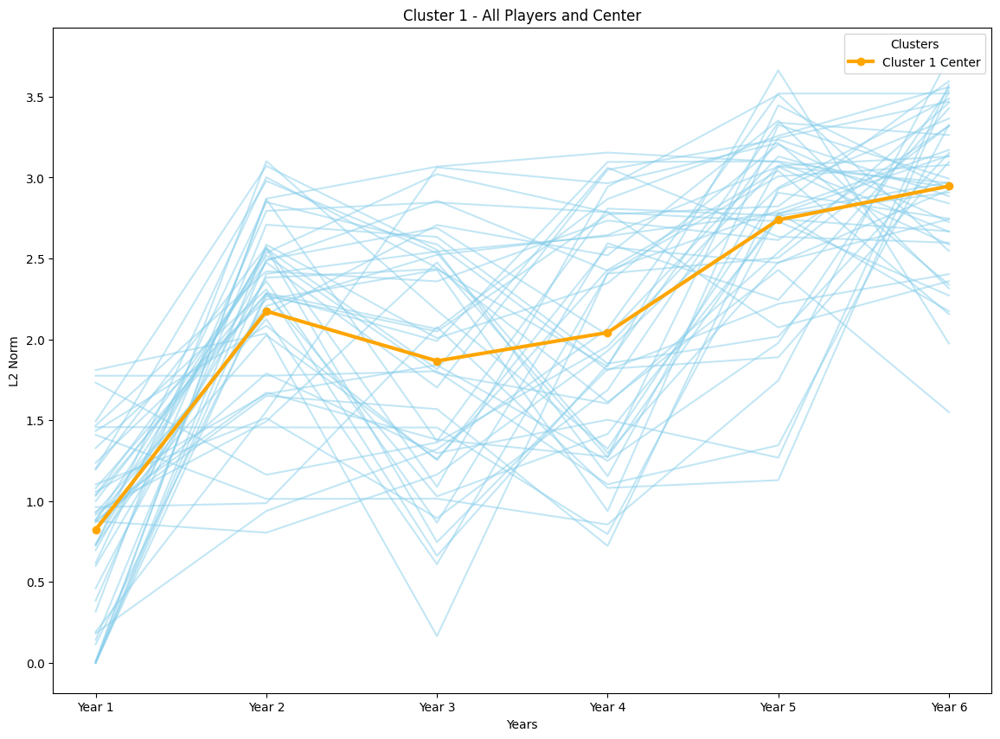

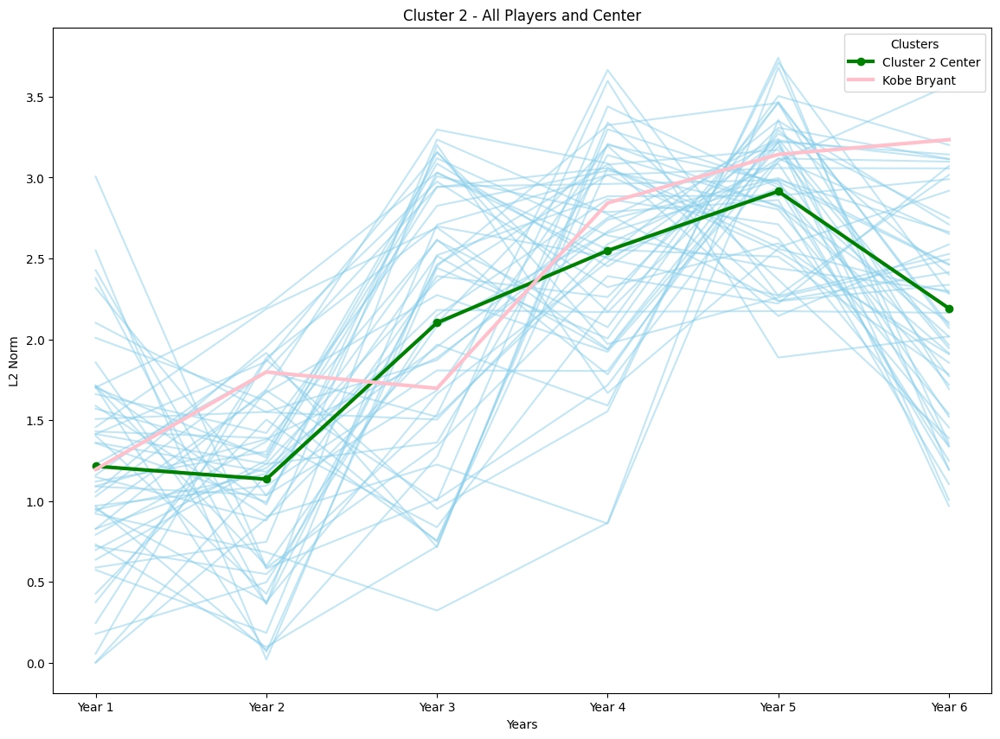

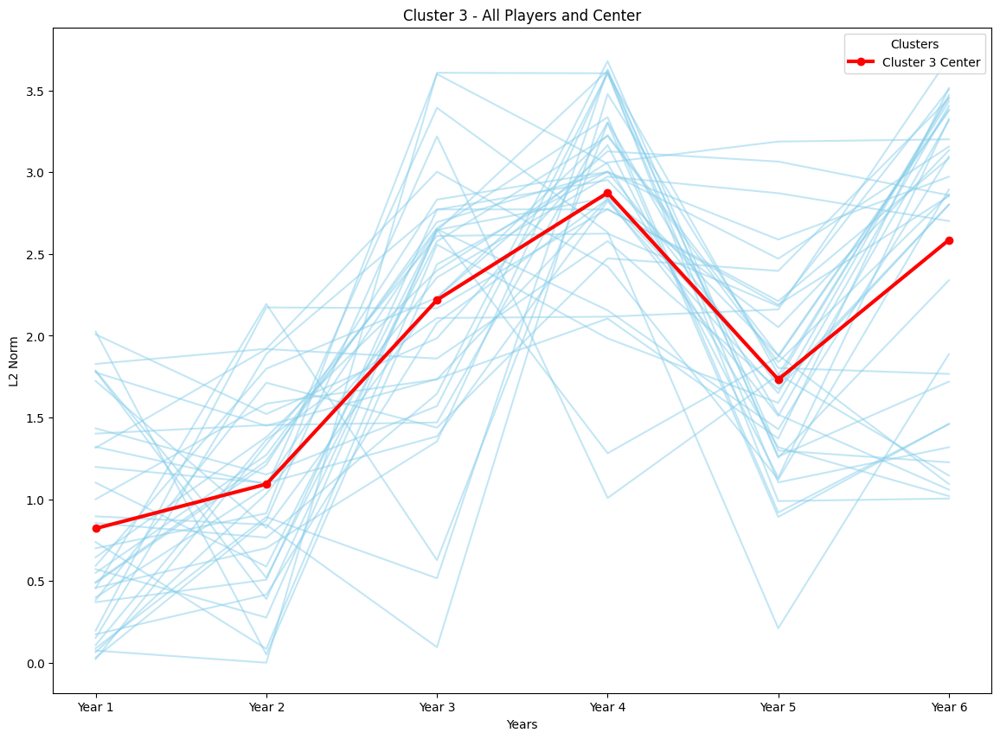

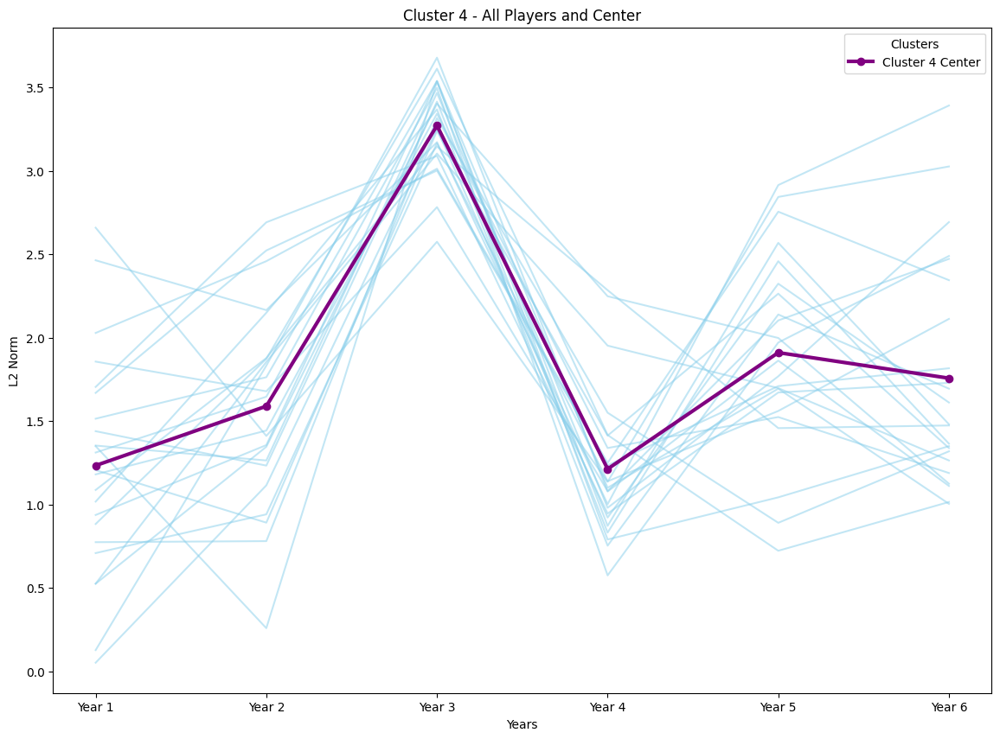

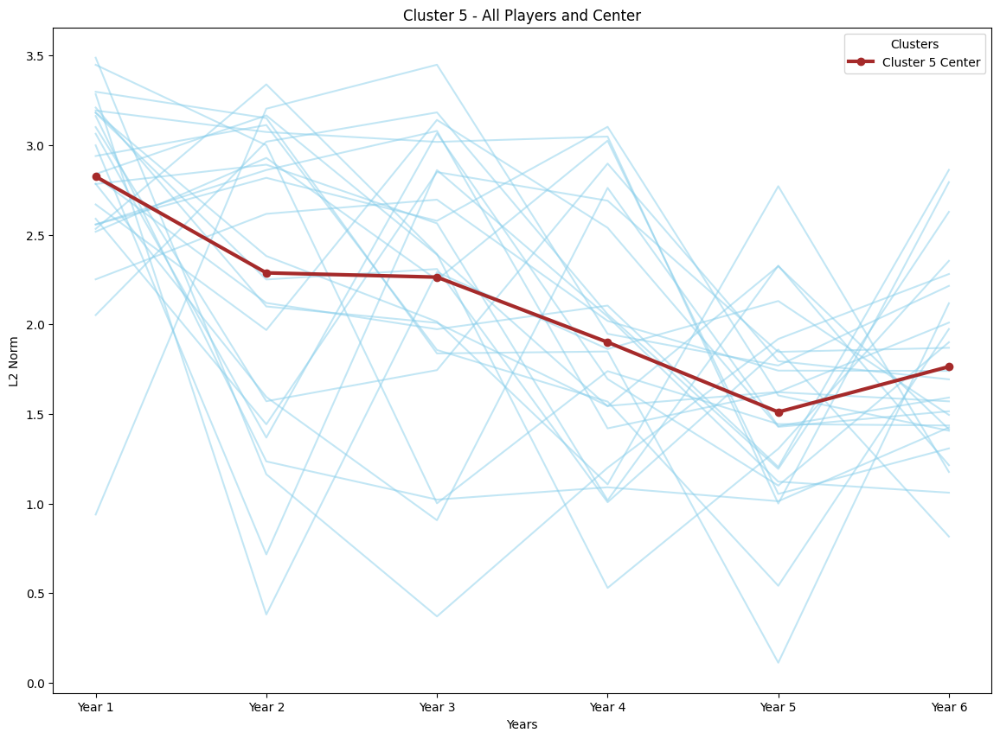

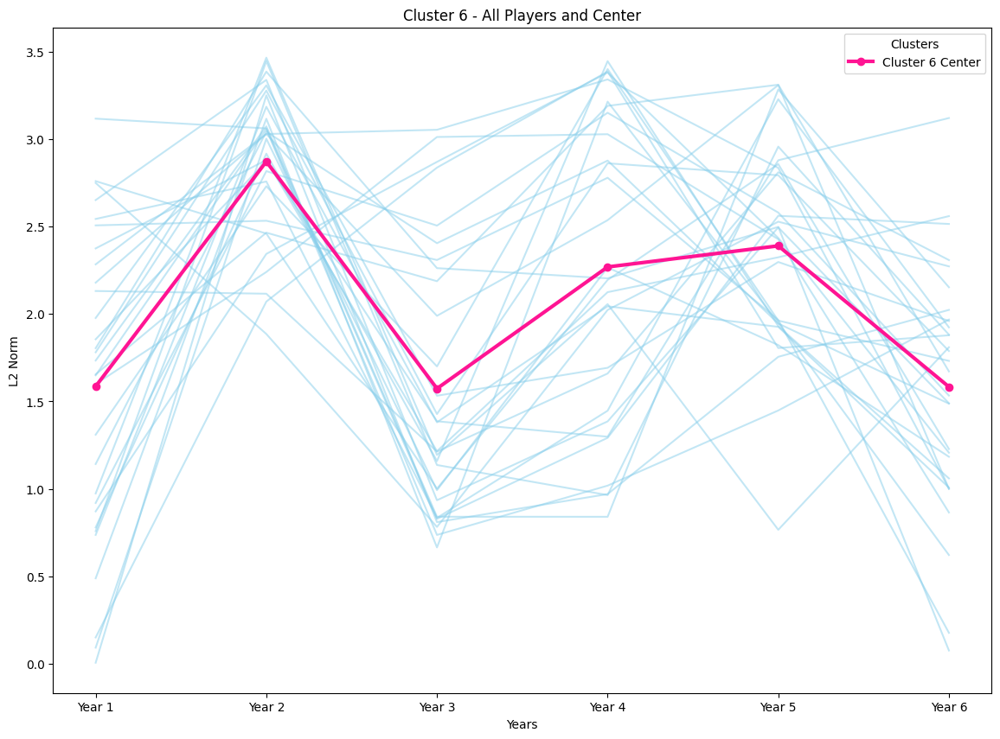

In [215]:
# hier 6 clusters
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 假设我们已经有了clusters, player_vectors, cluster_centers等数据
# cluster_colors 字典定义了每个簇的颜色
cluster_colors = {
    1: 'orange',  # Cluster 1 -> 橙色
    2: 'green',   # Cluster 2 -> 绿色
    3: 'red',     # Cluster 3 -> 红色
    4: 'purple',   # Cluster 4 -> 紫色
    5: 'brown',     
    6: 'DeepPink' 
}

kobe_name = 'Kobe Bryant'
kobe_cluster = df_clusters[df_clusters['Player'] == kobe_name]['Cluster'].iloc[0]

# 绘制每个簇的图
for cluster_id in np.unique(clusters):
    plt.figure(figsize=(14, 10))
    
    # 设置x轴（表示每一年的L2范数）
    years = [f'Year {i+1}' for i in range(6)]

    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])

    # 绘制该簇内所有球员的L2范数向量，使用天蓝色
    for vector in cluster_vectors:
        plt.plot(years, vector, color='skyblue', alpha=0.5)  # 使用天蓝色，透明度0.5
    
    # 获取该簇的聚类中心
    center_vector = cluster_centers[cluster_id]
    
    # 绘制该簇的聚类中心（使用指定颜色）
    plt.plot(years, center_vector, label=f'Cluster {cluster_id} Center', marker='o', color=cluster_colors[cluster_id], linewidth=3)

    if cluster_id == kobe_cluster:
        # 如果是Kobe Bryant所在的簇，用粉色画出他的L2范数向量
        kobe_vector = player_vectors[kobe_name]
        plt.plot(years, kobe_vector, label=f'{kobe_name}', color='pink', linewidth=3)
        
    # 添加图例和标签
    plt.title(f"Cluster {cluster_id} - All Players and Center")
    plt.xlabel("Years")
    plt.ylabel("L2 Norm")
    plt.legend(title="Clusters", loc="upper right")
    plt.savefig(f"hier_6_center_{cluster_id}.jpg")

    # 显示图形
    plt.show()


In [135]:
file = 'processed_players_season_stats.csv'
df_players = pd.read_csv(file)
df_combined = pd.merge(df_clusters, df_players, left_on='Player', right_on='PLAYER_NAME', how='left')

# 2. 按照簇进行分组，计算每个簇的最大值、最小值、均值和中位数
cluster_stats = df_combined.groupby('Cluster').agg({
    'PTS': ['max', 'min', 'mean', 'median'],  # 对PTS计算最大、最小、均值和中位数
    'year_salary': ['max', 'min', 'mean', 'median'],  # 对salary计算最大、最小、均值和中位数
    # 你还可以加入更多的属性，如 'career_PTS', 'career_AST' 等
}).reset_index()

# 3. 打印统计结果
print(cluster_stats)

  Cluster   PTS                        year_salary                          \
            max min        mean median         max       min          mean   
0       1  3426   3  807.712274  738.0  23775506.0   30000.0  4.630097e+06   
1       2  3940   0  682.672945  575.5  30453805.0    5000.0  3.877395e+06   
2       3  3022   4  612.551546  542.0  19000000.0   26007.0  3.192815e+06   
3       4  2762   0  604.258197  430.0  23410988.0  150000.0  4.867505e+06   
4       5  2800   2  613.746888  466.0  13775000.0   53465.0  2.114125e+06   
5       6  1938   0  595.143836  511.5  15300000.0   70000.0  3.384630e+06   

              
      median  
0  2500000.0  
1  2180232.5  
2  2033346.0  
3  3673707.0  
4  1138500.0  
5  1935312.5  


In [108]:
import pandas as pd
import numpy as np
from sklearn.metrics import pairwise_distances

# 假设我们已经有了clusters, player_vectors, cluster_centers等数据

# 找出每个簇的聚类中心对应的球员
cluster_centers_players = {}

# 对每个簇进行处理
for cluster_id in np.unique(clusters):
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])
    
    # 获取该簇的聚类中心
    center_vector = cluster_centers[cluster_id]
    
    # 计算聚类中心与所有球员向量的欧几里得距离
    distances = pairwise_distances(cluster_vectors, [center_vector], metric='euclidean').flatten()
    
    # 找到距离聚类中心最近的球员
    closest_player_index = np.argmin(distances)
    closest_player = cluster_players.iloc[closest_player_index]
    
    # 存储该簇的聚类中心和对应的球员名字
    cluster_centers_players[cluster_id] = closest_player

# 打印每个簇的聚类中心对应的球员
for cluster_id, closest_player in cluster_centers_players.items():
    print(f"Cluster {cluster_id} center corresponds to player: {closest_player}")


Cluster 1 center corresponds to player: Travis Best
Cluster 2 center corresponds to player: Ryan Anderson
Cluster 3 center corresponds to player: Chris Andersen
Cluster 4 center corresponds to player: Alec Burks
Cluster 5 center corresponds to player: Isiah Thomas
Cluster 6 center corresponds to player: Kelly Tripucka


In [111]:
df[df['PLAYER_NAME'] == 'Chris Andersen']

,PLAYER_NAME,LEAGUE_ID,GP,GS,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,...,DREB,REB,AST,STL,BLK,TO,PF,PTS,AGE,year_salary
526,Chris Andersen,2001-02,24,1.0,261.0,25,74,0.338,0.0,4.0,...,38.0,76.0,7,7.0,28.0,13.0,35,72,23.0,288171.0
527,Chris Andersen,2002-03,59,3.0,907.0,114,285,0.400,0.0,1.0,...,165.0,274.0,32,30.0,60.0,60.0,90,305,24.0,512435.0
528,Chris Andersen,2003-04,71,0.0,1029.0,90,203,0.443,0.0,1.0,...,209.0,298.0,35,34.0,114.0,48.0,119,243,25.0,638679.0
529,Chris Andersen,2004-05,67,2.0,1430.0,191,358,0.534,0.0,3.0,...,273.0,410.0,71,14.0,100.0,64.0,144,513,26.0,1600000.0
530,Chris Andersen,2005-06,32,2.0,570.0,56,98,0.571,0.0,0.0,...,94.0,155.0,6,8.0,41.0,26.0,84,161,27.0,3500000.0
531,Chris Andersen,2008-09,71,1.0,1460.0,160,292,0.548,2.0,10.0,...,279.0,442.0,31,41.0,175.0,69.0,174,452,30.0,998398.0
532,Chris Andersen,2009-10,76,0.0,1695.0,142,251,0.566,0.0,3.0,...,336.0,483.0,33,42.0,143.0,59.0,171,448,31.0,3650000.0
533,Chris Andersen,2010-11,45,0.0,732.0,82,137,0.599,0.0,1.0,...,144.0,219.0,20,23.0,58.0,25.0,79,250,32.0,4533300.0
534,Chris Andersen,2011-12,32,1.0,486.0,59,108,0.546,0.0,0.0,...,100.0,148.0,6,19.0,46.0,17.0,52,168,33.0,4234000.0
535,Chris Andersen,2012-13,42,0.0,624.0,71,123,0.577,2.0,3.0,...,115.0,172.0,17,16.0,44.0,24.0,89,207,34.0,4526000.0


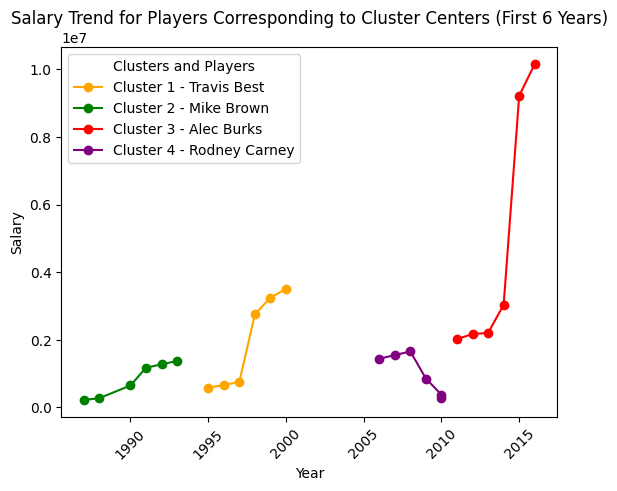

In [216]:
# 先从 LEAGUE_ID 中提取年份（例如 2007-08 中提取 2007）
df['year'] = df['LEAGUE_ID'].str.split('-').str[0].astype(int)

# 遍历每个簇
for cluster_id, player_name in cluster_centers_players.items():
    # 获取该球员的所有数据
    player_data = df[df['PLAYER_NAME'] == player_name].sort_values(by='year')  # 按照年份排序
    
    # 提取该球员的工资数据（前六年）
    player_salary = player_data[['year', 'year_salary']].head(6)

    # 绘制折线图
    plt.plot(player_salary['year'], player_salary['year_salary'], label=f'Cluster {cluster_id} - {player_name}', color=cluster_colors[cluster_id], marker='o')

# 添加图例和标签
plt.title("Salary Trend for Players Corresponding to Cluster Centers (First 6 Years)")
plt.xlabel("Year")
plt.ylabel("Salary")

# 调整x轴标签的角度以避免重叠
plt.xticks(rotation=45)

plt.legend(title="Clusters and Players", loc='upper left', fontsize=10)
plt.savefig(f"hier_6_salary_trend.jpg")
# 显示图形
plt.show()


In [113]:
# accuracy 3 years mse
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 计算与每个簇的聚类中心前三年部分的距离
    distances = {}
    for cluster_id, center in cluster_centers.items():
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第4、5、6年（预测值）
    predicted_years_4_6 = cluster_centers[predicted_cluster][3:6]
    
    # 获取该球员的真实第4、5、6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    true_years_4_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[3:6]['year_salary'].values
    
    # 存储真实值和预测值
    true_values.extend(true_years_4_6)
    predictions.extend(predicted_years_4_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 27537124749565.65
Prediction Accuracy: 0.23333333333333334


In [136]:
# accuracy 3 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 读取数据（确保数据包含player_vectors和cluster_centers等内容）
# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前三年数据和对应的簇标签
X = []  # 特征：前三年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 添加到特征列表X
    X.append(player_front_three)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    for cluster_id, center in cluster_centers.items():
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.7545454545454546 ± 0.13965719541579286


In [114]:
# 4 years mse
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error
# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前四年向量
    player_front_four = vector[:4]
    
    # 计算与每个簇的聚类中心前四年部分的距离
    distances = {}
    for cluster_id, center in cluster_centers.items():
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_four - center[:4])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第5年和第6年
    predicted_years_5_6 = cluster_centers[predicted_cluster][4:]
    
    # 获取该球员的真实第5年和第6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    true_years_5_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[4:6]['year_salary'].values
    
    # 存储真实值和预测值
    true_values.extend(true_years_5_6)
    predictions.extend(predicted_years_5_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")

Mean Squared Error: 35651198494160.88
Prediction Accuracy: 0.19545454545454546


In [138]:
# 4 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前四年数据和对应的簇标签
X = []  # 特征：前四年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前四年向量
    player_front_four = vector[:4]
    
    # 添加到特征列表X
    X.append(player_front_four)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    for cluster_id, center in cluster_centers.items():
        distances[cluster_id] = np.linalg.norm(player_front_four - center[:4])
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.7227272727272728 ± 0.08181818181818183


In [115]:
# 5 years mse
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 计算与每个簇的聚类中心前五年部分的距离
    distances = {}
    for cluster_id, center in cluster_centers.items():
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第6年（预测值）
    predicted_year_6 = cluster_centers[predicted_cluster][5]
    
    # 获取该球员的真实第6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    true_year_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[5]['year_salary']
    
    # 存储真实值和预测值
    true_values.append(true_year_6)
    predictions.append(predicted_year_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 39196861867112.6
Prediction Accuracy: 0.2


In [139]:
# 5 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    for cluster_id, center in cluster_centers.items():
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.859090909090909 ± 0.05640760748177663


len eligible_players 220
每个簇的球员数量：
Cluster
2    93
4    56
1    48
3    23
Name: count, dtype: int64


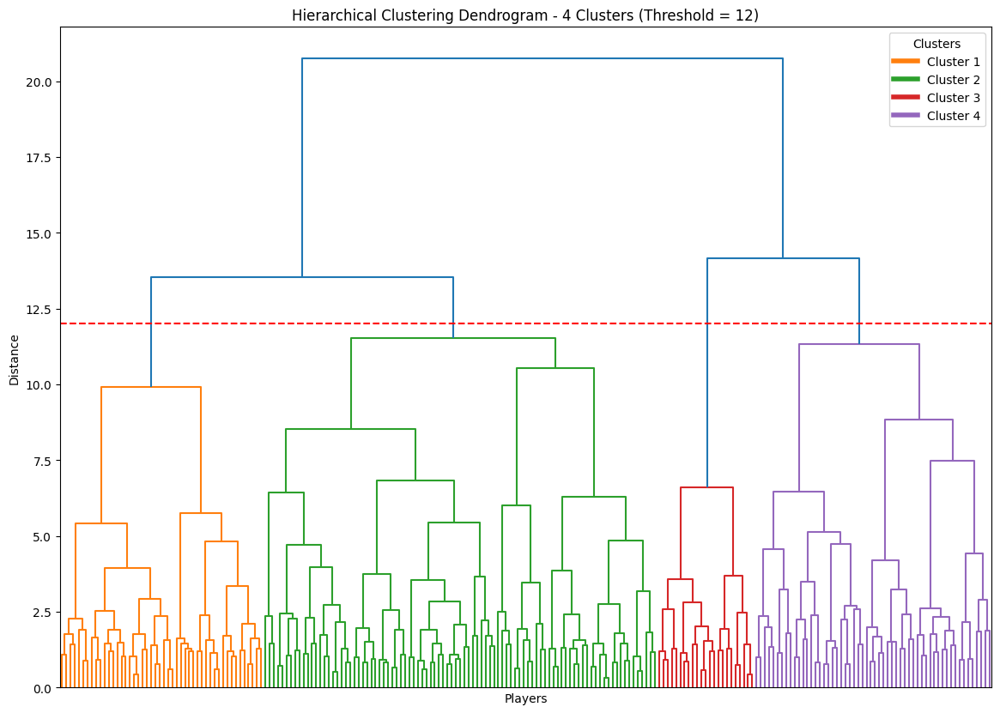

In [229]:
# hier 4 clusters
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 读取数据
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 选择需要进行聚类的列
columns_for_clustering = [
    'FGM', 'FG_PCT', 'FG3M', 'FG3_PCT', 'FTM', 'FT_PCT', 'OREB', 'DREB', 
    'REB', 'AST', 'STL', 'BLK', 'PTS', 'year_salary'
]

# 过滤出打了6年及以上的球员
player_counts = df['PLAYER_NAME'].value_counts()
eligible_players = player_counts[player_counts >= 6].index
df_filtered = df[df['PLAYER_NAME'].isin(eligible_players)]

print('len eligible_players', len(eligible_players))
# 计算每个球员的每个属性归一化并计算L2范数
scaler = MinMaxScaler()

# 用一个字典存储每个球员的6年长向量
player_vectors = {}

for player in eligible_players:
    # 获取该球员的6年数据（按年份排序）
    player_data = df_filtered[df_filtered['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    if len(player_data) >= 6:  # 确保该球员有6年数据
        # 提取前6年的数据
        player_data = player_data.iloc[:6][columns_for_clustering]
        
        # 对每个属性进行归一化
        player_data_normalized = scaler.fit_transform(player_data)
        
        # 计算L2范数，得到一个6年的向量
        l2_norm_vector = np.linalg.norm(player_data_normalized, axis=1)
        
        # 存储每个球员的L2范数向量
        player_vectors[player] = l2_norm_vector

# 1. 整理数据
# 将每个球员的6年L2范数向量存储到DataFrame中
vectors_list = []
players = []

for player, vector in player_vectors.items():
    # 记录球员名字
    players.append(player)
    # 将6年L2范数向量合并为一个向量
    vectors_list.append(vector)

# 创建一个DataFrame，列为6个年限的L2范数
df_vectors = pd.DataFrame(vectors_list)

# 2. 标准化
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_vectors)

# 3. 层次聚类
Z = linkage(df_scaled, method='ward')

# 设置距离阈值
distance_threshold = 12
clusters = fcluster(Z, t=distance_threshold, criterion='distance')

# 4. 打印每个簇的球员数量
df_clusters = pd.DataFrame({
    'Player': players,
    'Cluster': clusters
})

cluster_counts = df_clusters['Cluster'].value_counts()
print("每个簇的球员数量：")
print(cluster_counts)

# 5. 绘制树状图
plt.figure(figsize=(14, 10))
dendro = dendrogram(
    Z,
    labels=df_clusters['Player'].values,
    leaf_rotation=90,
    leaf_font_size=8,
    color_threshold=distance_threshold,
    no_labels=True  # 不画名字
)

plt.title(f"Hierarchical Clustering Dendrogram - 4 Clusters (Threshold = {distance_threshold})")
plt.xlabel("Players")
plt.ylabel("Distance")
plt.axhline(y=distance_threshold, c='red', linestyle='--')

# 绘制图例
from matplotlib.lines import Line2D

cluster_colors = ['C1', 'C2', 'C3', 'C4']
cluster_labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']

legend_elements = [
    Line2D([0], [0], color=color, lw=4, label=label)
    for color, label in zip(cluster_colors, cluster_labels)
]

plt.legend(handles=legend_elements, title='Clusters', loc='upper right', fontsize=10)
plt.savefig(f"hier_4_dendro.jpg")
plt.show()


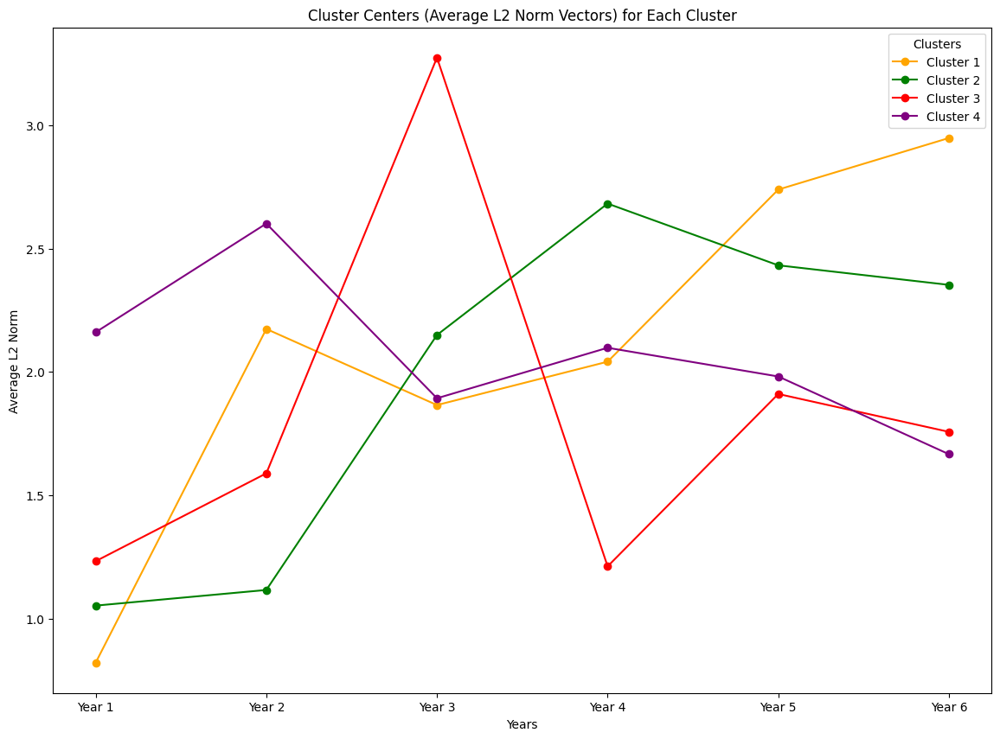

In [219]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 计算每个簇的聚类中心：即每个簇内所有球员的L2范数向量的平均值
cluster_centers = {}
for cluster_id in np.unique(clusters):
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取每个球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])
    
    # 计算该簇的聚类中心（平均L2范数向量）
    cluster_centers[cluster_id] = np.mean(cluster_vectors, axis=0)

# 定义每个簇的颜色
cluster_colors = {
    1: 'orange',  # Cluster 1 -> 橙色
    2: 'green',   # Cluster 2 -> 绿色
    3: 'red',     # Cluster 3 -> 红色
    4: 'purple'   # Cluster 4 -> 紫色
}

# 绘制每个簇的聚类中心的折线图
plt.figure(figsize=(14, 10))

# 设置x轴（表示每一年的L2范数）
years = [f'Year {i+1}' for i in range(6)]

# 绘制每个簇的聚类中心，并指定颜色
for cluster_id, center_vector in cluster_centers.items():
    plt.plot(years, center_vector, label=f'Cluster {cluster_id}', marker='o', color=cluster_colors.get(cluster_id, 'black'))

# 添加图例和标签
plt.title("Cluster Centers (Average L2 Norm Vectors) for Each Cluster")
plt.xlabel("Years")
plt.ylabel("Average L2 Norm")
plt.legend(title="Clusters", loc="upper right")
plt.savefig(f"hier_4_center.jpg")
# 显示图形
plt.show()


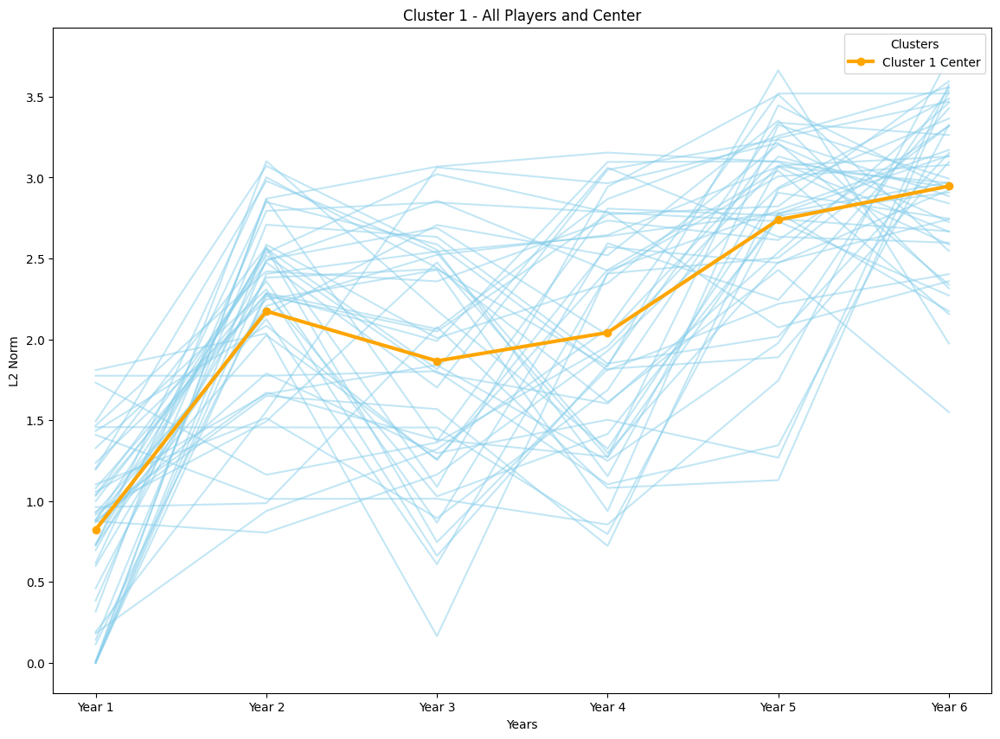

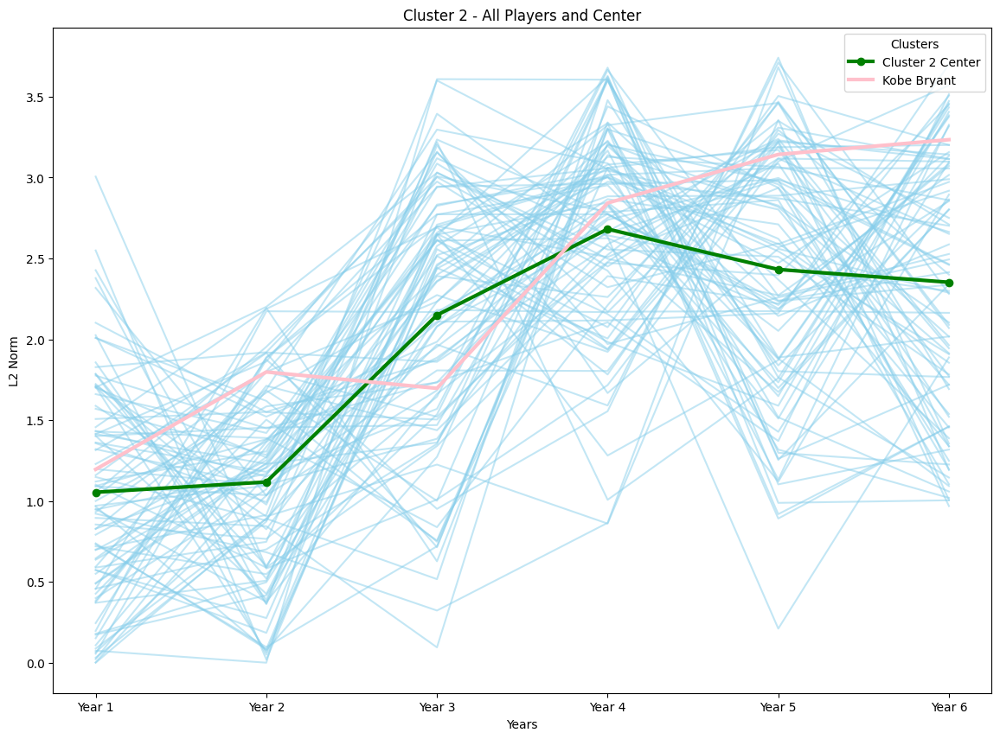

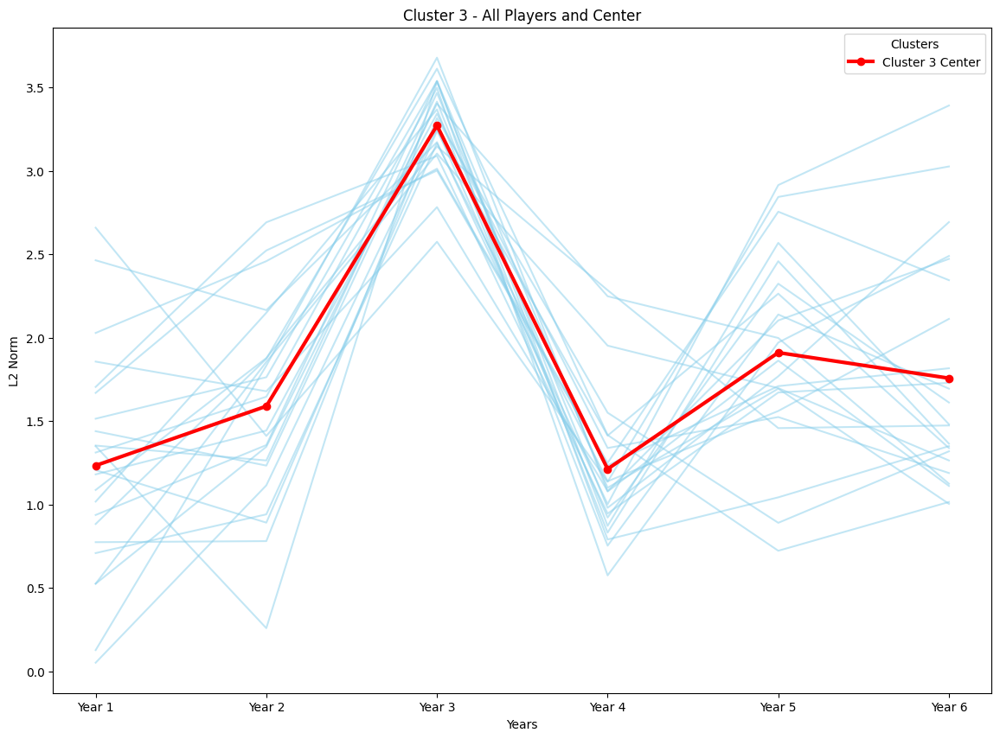

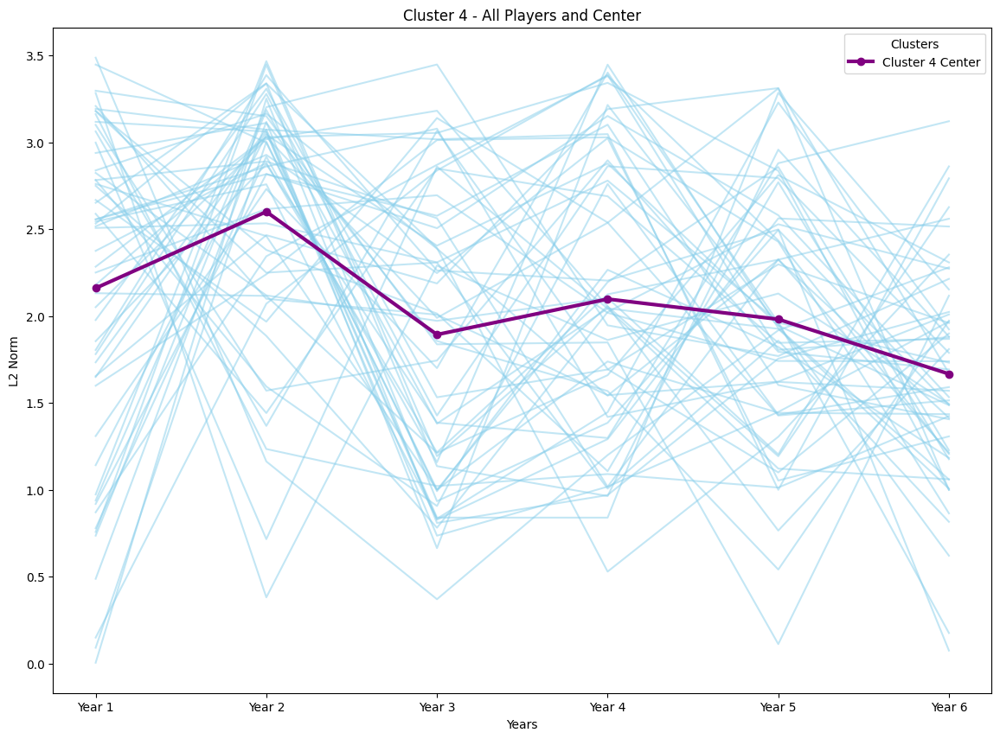

In [220]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 假设我们已经有了clusters, player_vectors, cluster_centers等数据
# cluster_colors 字典定义了每个簇的颜色
cluster_colors = {
    1: 'orange',  # Cluster 1 -> 橙色
    2: 'green',   # Cluster 2 -> 绿色
    3: 'red',     # Cluster 3 -> 红色
    4: 'purple'   # Cluster 4 -> 紫色
}

kobe_name = 'Kobe Bryant'
kobe_cluster = df_clusters[df_clusters['Player'] == kobe_name]['Cluster'].iloc[0]

# 绘制每个簇的图
for cluster_id in np.unique(clusters):
    plt.figure(figsize=(14, 10))
    
    # 设置x轴（表示每一年的L2范数）
    years = [f'Year {i+1}' for i in range(6)]

    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])

    # 绘制该簇内所有球员的L2范数向量，使用天蓝色
    for vector in cluster_vectors:
        plt.plot(years, vector, color='skyblue', alpha=0.5)  # 使用天蓝色，透明度0.5
    
    # 获取该簇的聚类中心
    center_vector = cluster_centers[cluster_id]
    
    # 绘制该簇的聚类中心（使用指定颜色）
    plt.plot(years, center_vector, label=f'Cluster {cluster_id} Center', marker='o', color=cluster_colors[cluster_id], linewidth=3)

    if cluster_id == kobe_cluster:
        # 如果是Kobe Bryant所在的簇，用粉色画出他的L2范数向量
        kobe_vector = player_vectors[kobe_name]
        plt.plot(years, kobe_vector, label=f'{kobe_name}', color='pink', linewidth=3)
        
    # 添加图例和标签
    plt.title(f"Cluster {cluster_id} - All Players and Center")
    plt.xlabel("Years")
    plt.ylabel("L2 Norm")
    plt.legend(title="Clusters", loc="upper right")
    plt.savefig(f"hier_4_center_{cluster_id}.jpg")

    # 显示图形
    plt.show()


In [119]:
file = 'processed_players_season_stats.csv'
df_players = pd.read_csv(file)
df_combined = pd.merge(df_clusters, df_players, left_on='Player', right_on='PLAYER_NAME', how='left')

# 2. 按照簇进行分组，计算每个簇的最大值、最小值、均值和中位数
cluster_stats = df_combined.groupby('Cluster').agg({
    'PTS': ['max', 'min', 'mean', 'median'],  # 对PTS计算最大、最小、均值和中位数
    'year_salary': ['max', 'min', 'mean', 'median'],  # 对salary计算最大、最小、均值和中位数
    # 你还可以加入更多的属性，如 'career_PTS', 'career_AST' 等
}).reset_index()

# 3. 打印统计结果
print(cluster_stats)

  Cluster   PTS                        year_salary                          \
            max min        mean median         max       min          mean   
0       1  3426   3  807.712274  738.0  23775506.0   30000.0  4.630097e+06   
1       2  3940   0  654.682099  558.0  30453805.0    5000.0  3.604126e+06   
2       3  2762   0  604.258197  430.0  23410988.0  150000.0  4.867505e+06   
3       4  2800   0  603.555347  494.0  15300000.0   53465.0  2.810162e+06   

              
      median  
0  2500000.0  
1  2100000.0  
2  3673707.0  
3  1465000.0  


In [146]:
import pandas as pd
import numpy as np
from sklearn.metrics import pairwise_distances

# 假设我们已经有了clusters, player_vectors, cluster_centers等数据

# 找出每个簇的聚类中心对应的球员
cluster_centers_players = {}

# 对每个簇进行处理
for cluster_id in np.unique(clusters):
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])
    
    # 获取该簇的聚类中心
    center_vector = cluster_centers[cluster_id]
    
    # 计算聚类中心与所有球员向量的欧几里得距离
    distances = pairwise_distances(cluster_vectors, [center_vector], metric='euclidean').flatten()
    
    # 找到距离聚类中心最近的球员
    closest_player_index = np.argmin(distances)
    closest_player = cluster_players.iloc[closest_player_index]
    
    # 存储该簇的聚类中心和对应的球员名字
    cluster_centers_players[cluster_id] = closest_player

# 打印每个簇的聚类中心对应的球员
for cluster_id, closest_player in cluster_centers_players.items():
    print(f"Cluster {cluster_id} center corresponds to player: {closest_player}")


Cluster 1 center corresponds to player: Travis Best
Cluster 2 center corresponds to player: Mike Brown
Cluster 3 center corresponds to player: Alec Burks
Cluster 4 center corresponds to player: Rodney Carney


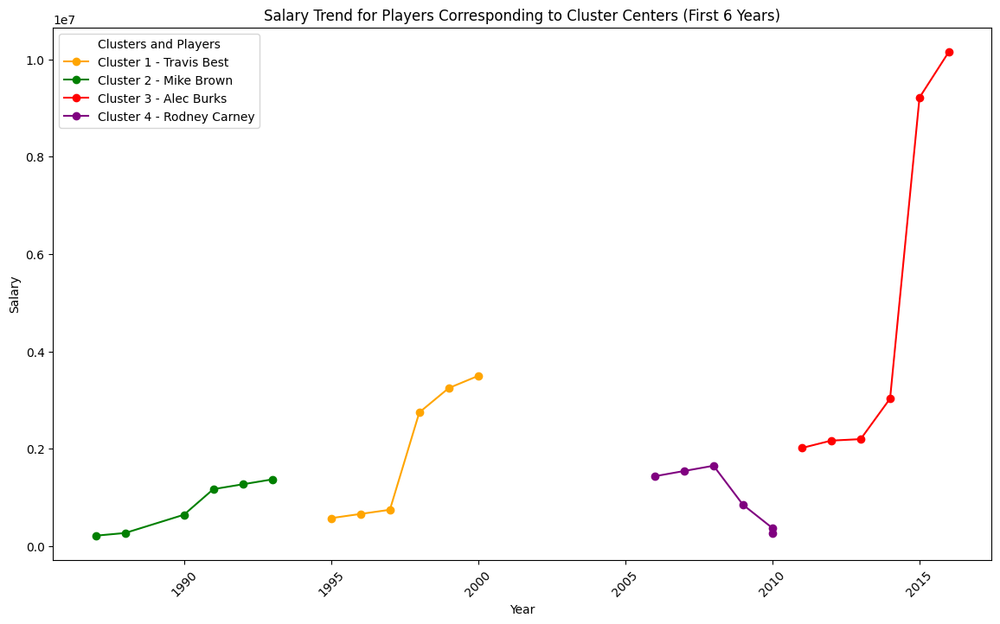

In [221]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 假设我们已经有了df和player_vectors等数据

# 找出每个簇的聚类中心对应的球员
cluster_centers_players = {
    1: 'Travis Best', 
    2: 'Mike Brown',  
    3: 'Alec Burks',  
    4: 'Rodney Carney', 
}

# 读取工资数据
# 假设df中有player_name和year_salary列
# 我们根据player_name和year做筛选并画出工资折线图

plt.figure(figsize=(14, 8))

# 每个簇的颜色
cluster_colors = { 
    1: 'orange',  
    2: 'green',   
    3: 'red',     
    4: 'purple'   
}

# 先从 LEAGUE_ID 中提取年份（例如 2007-08 中提取 2007）
df['year'] = df['LEAGUE_ID'].str.split('-').str[0].astype(int)

# 遍历每个簇
for cluster_id, player_name in cluster_centers_players.items():
    # 获取该球员的所有数据
    player_data = df[df['PLAYER_NAME'] == player_name].sort_values(by='year')  # 按照年份排序
    
    # 提取该球员的工资数据（前六年）
    player_salary = player_data[['year', 'year_salary']].head(6)  # 假设 'year' 是年份字段

    # 绘制折线图
    plt.plot(player_salary['year'], player_salary['year_salary'], label=f'Cluster {cluster_id} - {player_name}', color=cluster_colors[cluster_id], marker='o')

# 添加图例和标签
plt.title("Salary Trend for Players Corresponding to Cluster Centers (First 6 Years)")
plt.xlabel("Year")
plt.ylabel("Salary")

# 调整x轴标签的角度以避免重叠
plt.xticks(rotation=45)

plt.legend(title="Clusters and Players", loc='upper left', fontsize=10)
plt.savefig(f"hier_4_salary_trend.jpg")
# 显示图形
plt.show()


In [122]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 计算与每个簇的聚类中心前三年部分的距离
    distances = {}
    for cluster_id, center in cluster_centers.items():
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第4、5、6年（预测值）
    predicted_years_4_6 = cluster_centers[predicted_cluster][3:6]
    
    # 获取该球员的真实第4、5、6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    true_years_4_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[3:6]['year_salary'].values
    
    # 存储真实值和预测值
    true_values.extend(true_years_4_6)
    predictions.extend(predicted_years_4_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 27537124463550.75
Prediction Accuracy: 0.23333333333333334


In [148]:
# accuracy 3 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 读取数据（确保数据包含player_vectors和cluster_centers等内容）
# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前三年数据和对应的簇标签
X = []  # 特征：前三年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 添加到特征列表X
    X.append(player_front_three)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    for cluster_id, center in cluster_centers.items():
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.8090909090909092 ± 0.05102260072873557


In [123]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error
# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前四年向量
    player_front_four = vector[:4]
    
    # 计算与每个簇的聚类中心前四年部分的距离
    distances = {}
    for cluster_id, center in cluster_centers.items():
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_four - center[:4])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第5年和第6年
    predicted_years_5_6 = cluster_centers[predicted_cluster][4:]
    
    # 获取该球员的真实第5年和第6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    true_years_5_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[4:6]['year_salary'].values
    
    # 存储真实值和预测值
    true_values.extend(true_years_5_6)
    predictions.extend(predicted_years_5_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")

Mean Squared Error: 35651197879191.95
Prediction Accuracy: 0.19545454545454546


In [149]:
# 4 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前四年数据和对应的簇标签
X = []  # 特征：前四年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前四年向量
    player_front_four = vector[:4]
    
    # 添加到特征列表X
    X.append(player_front_four)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    for cluster_id, center in cluster_centers.items():
        distances[cluster_id] = np.linalg.norm(player_front_four - center[:4])
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.8318181818181818 ± 0.061991734986299334


In [124]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 计算与每个簇的聚类中心前五年部分的距离
    distances = {}
    for cluster_id, center in cluster_centers.items():
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第6年（预测值）
    predicted_year_6 = cluster_centers[predicted_cluster][5]
    
    # 获取该球员的真实第6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    true_year_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[5]['year_salary']
    
    # 存储真实值和预测值
    true_values.append(true_year_6)
    predictions.append(predicted_year_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 39196860898957.84
Prediction Accuracy: 0.2


len eligible_players 220


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


每个簇的球员数量：
Cluster
2    64
4    40
3    37
1    35
0    22
5    22
Name: count, dtype: int64


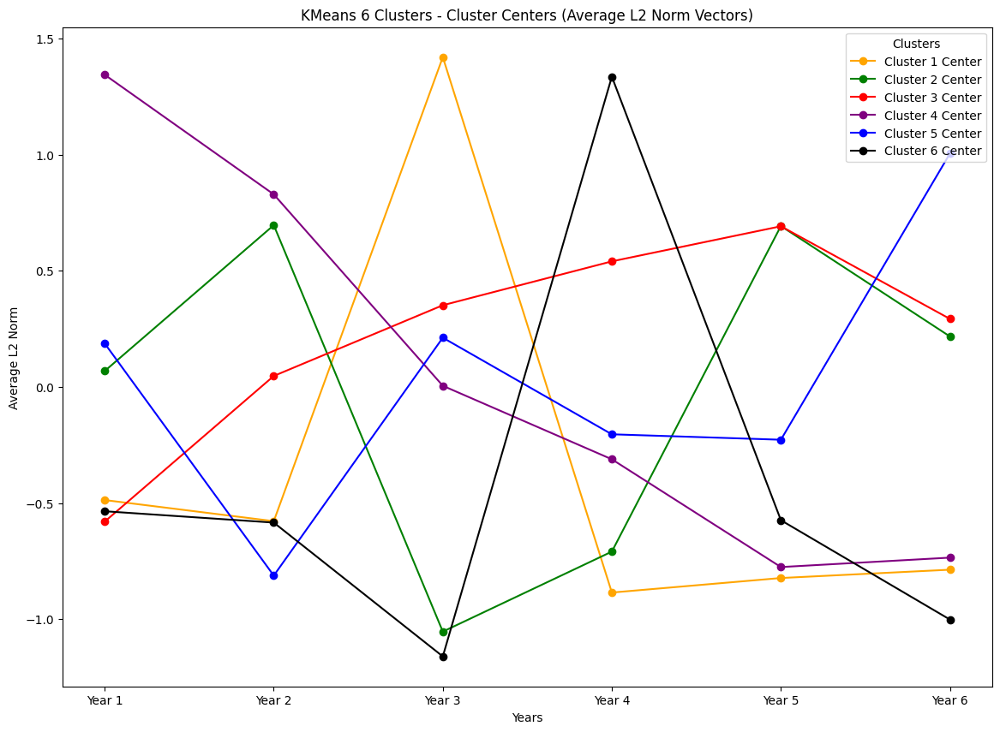

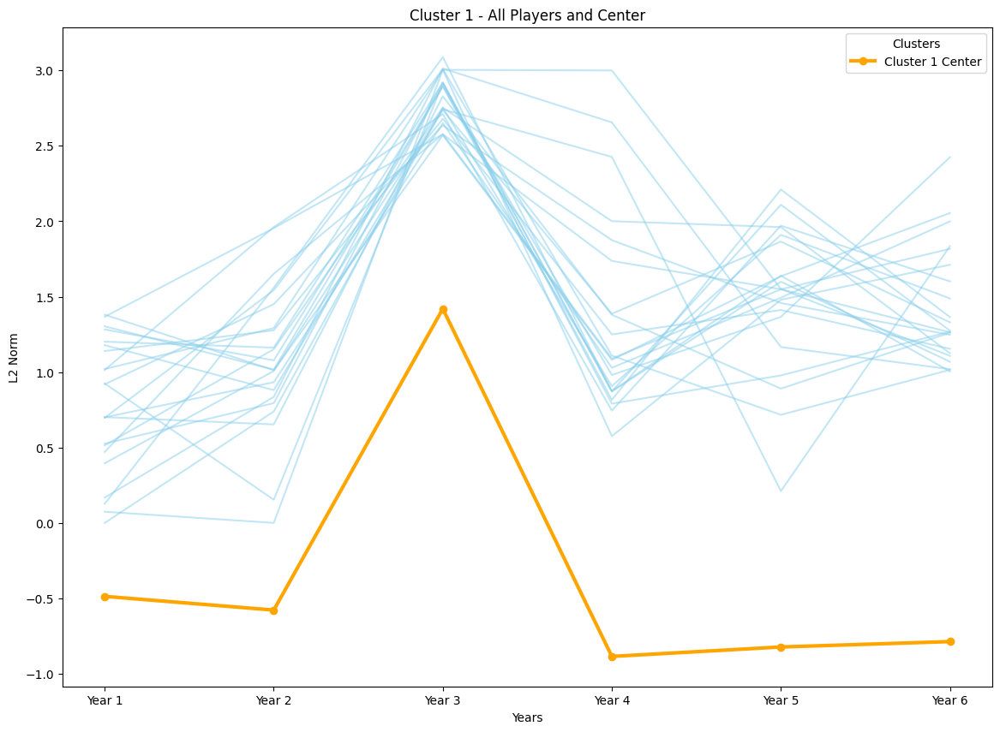

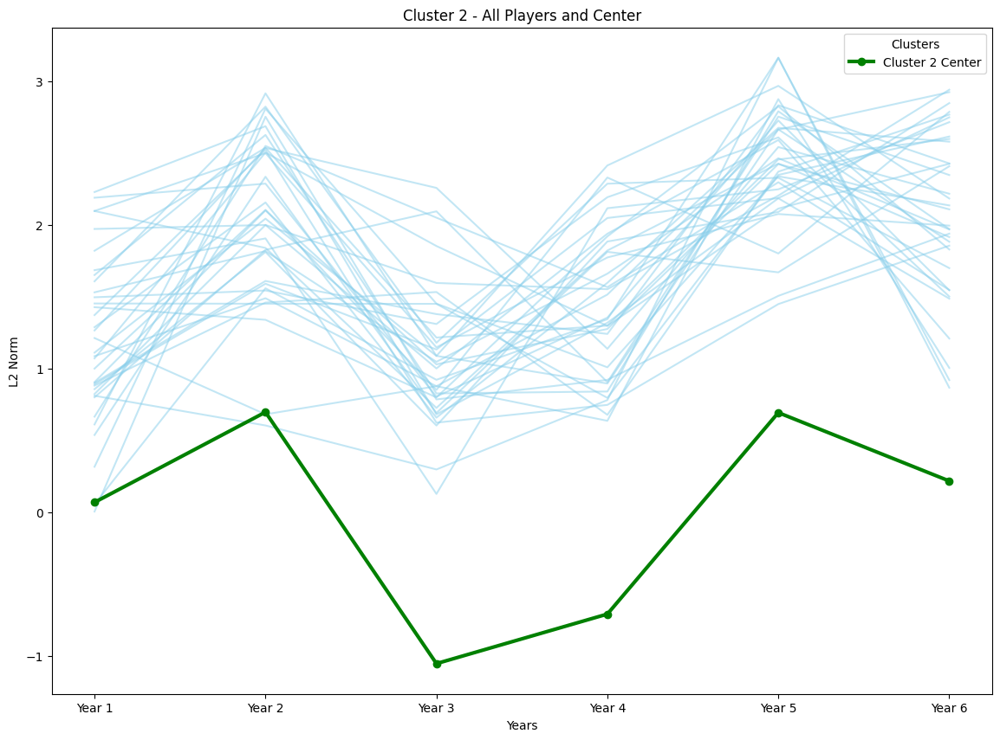

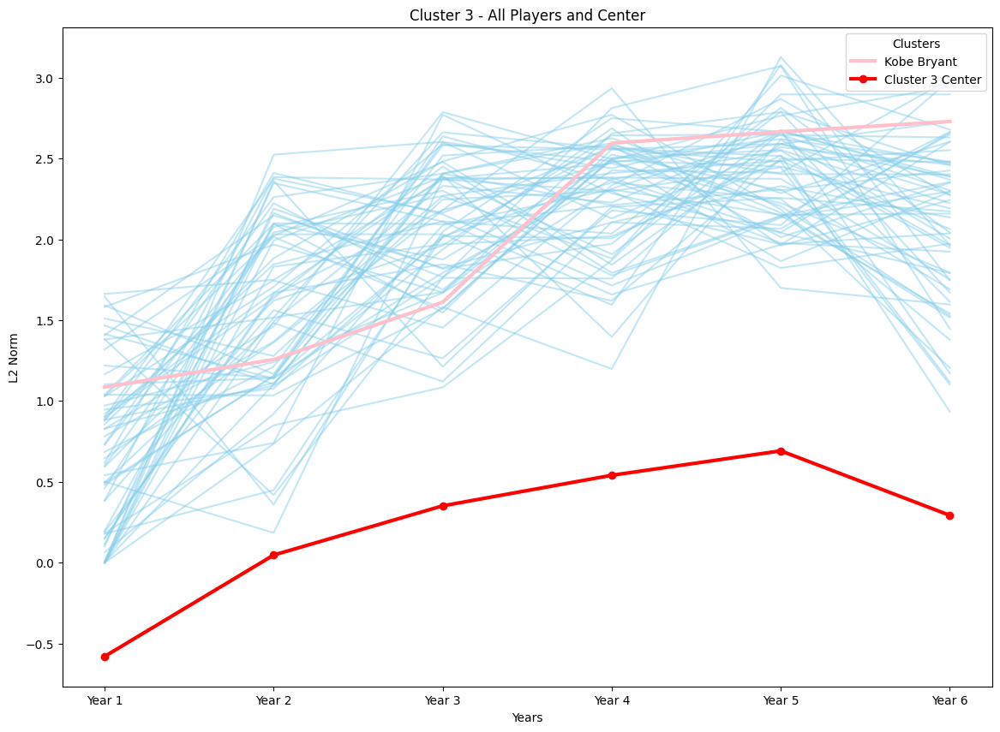

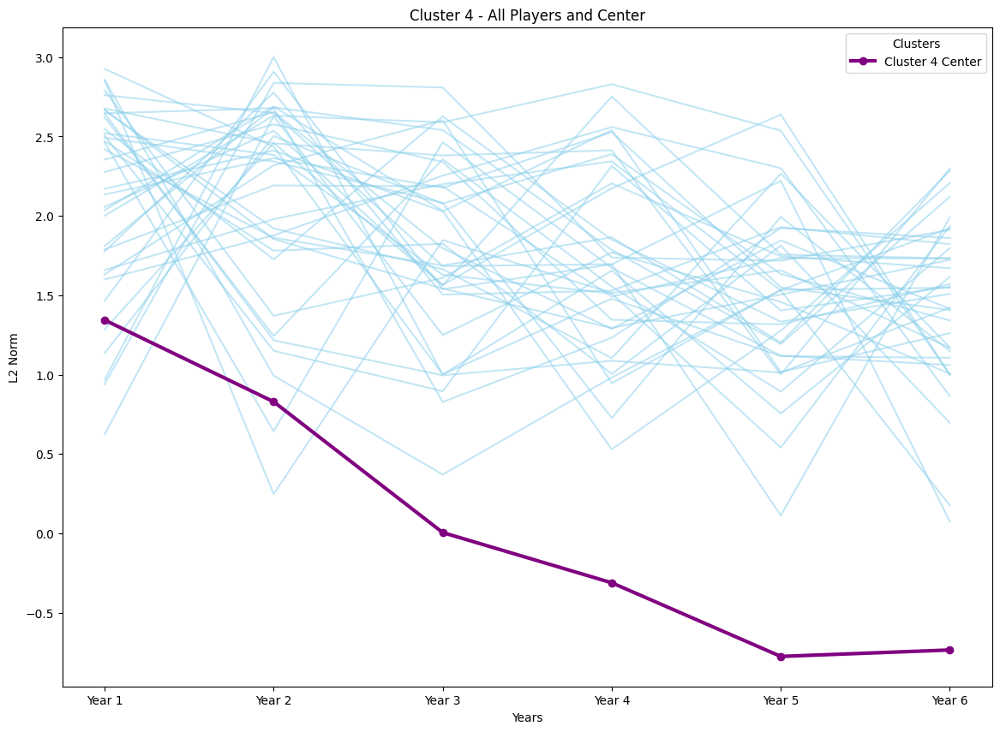

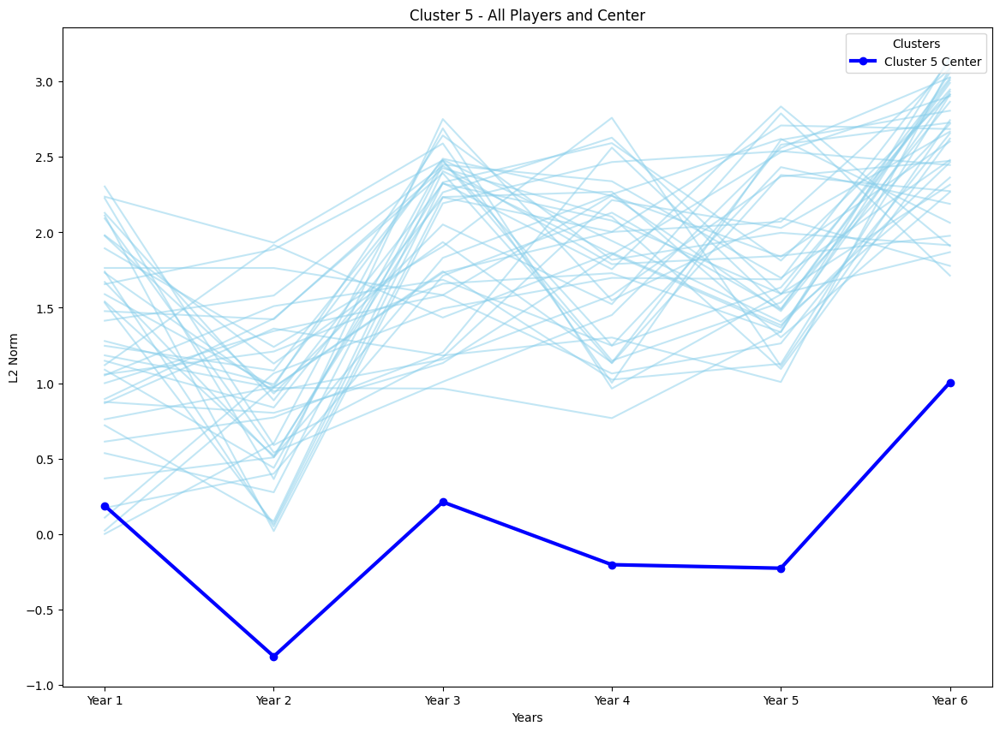

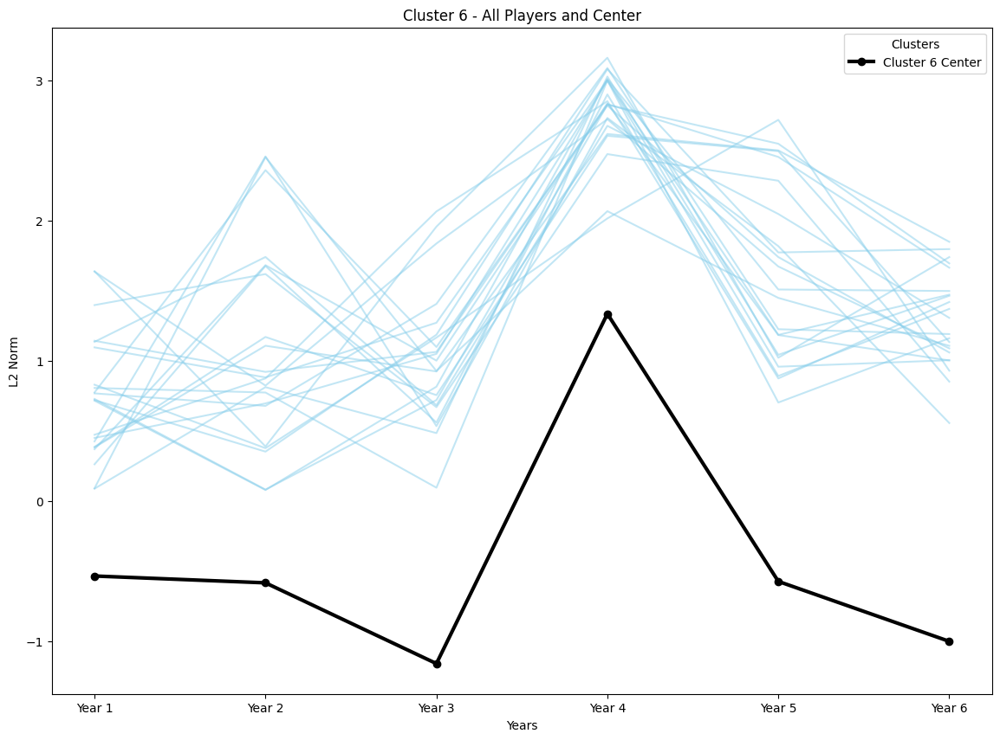

In [224]:
#kmeans 6 clusters
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans


import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 读取数据
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 选择需要进行聚类的列
columns_for_clustering = [
    'FG_PCT',  'FG3_PCT', 'FT_PCT', 'OREB', 'DREB', 
    'REB', 'STL', 'BLK', 'PTS', 'year_salary'
]

# 过滤出打了6年及以上的球员
player_counts = df['PLAYER_NAME'].value_counts()
eligible_players = player_counts[player_counts >= 6].index
df_filtered = df[df['PLAYER_NAME'].isin(eligible_players)]

print('len eligible_players', len(eligible_players))
# 计算每个球员的每个属性归一化并计算L2范数
scaler = MinMaxScaler()

# 用一个字典存储每个球员的6年长向量
player_vectors = {}

for player in eligible_players:
    # 获取该球员的6年数据（按年份排序）
    player_data = df_filtered[df_filtered['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    if len(player_data) >= 6:  # 确保该球员有6年数据
        # 提取前6年的数据
        player_data = player_data.iloc[:6][columns_for_clustering]
        
        # 对每个属性进行归一化
        player_data_normalized = scaler.fit_transform(player_data)
        
        # 计算L2范数，得到一个6年的向量
        l2_norm_vector = np.linalg.norm(player_data_normalized, axis=1)
        
        # 存储每个球员的L2范数向量
        player_vectors[player] = l2_norm_vector


# 1. 整理数据
# 将每个球员的6年L2范数向量存储到DataFrame中
vectors_list = []
players = []

for player, vector in player_vectors.items():
    # 记录球员名字
    players.append(player)
    # 将6年L2范数向量合并为一个向量
    vectors_list.append(vector)

# 创建一个DataFrame，列为6个年限的L2范数
df_vectors = pd.DataFrame(vectors_list)

# 2. 标准化
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_vectors)

# 3. 使用KMeans聚类
n_clusters = 6 # 你可以根据需要调整簇的数量
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(df_scaled)

# 4. 打印每个簇的球员数量
df_clusters = pd.DataFrame({
    'Player': players,
    'Cluster': clusters
})

cluster_counts = df_clusters['Cluster'].value_counts()
print("每个簇的球员数量：")
print(cluster_counts)

# 5. 绘制每个簇的图
cluster_colors = ['orange', 'green', 'red', 'purple', 'blue', 'black']

# 获取KMeans的聚类中心
cluster_centers = kmeans.cluster_centers_

# 绘制每个簇的聚类中心的折线图
plt.figure(figsize=(14, 10))
years = [f'Year {i+1}' for i in range(6)]

# 绘制每个簇的聚类中心，并指定颜色
for cluster_id, center_vector in enumerate(cluster_centers):
    plt.plot(years, center_vector, label=f'Cluster {cluster_id+1} Center', marker='o', color=cluster_colors[cluster_id])

# 添加图例和标签
plt.title("KMeans 6 Clusters - Cluster Centers (Average L2 Norm Vectors)")
plt.xlabel("Years")
plt.ylabel("Average L2 Norm")
plt.legend(title="Clusters", loc="upper right")
plt.savefig(f"kmeans_6_center.jpg")
# 显示图形
plt.show()

kobe_name = 'Kobe Bryant'
kobe_cluster = df_clusters[df_clusters['Player'] == kobe_name]['Cluster'].iloc[0]

# 6. 绘制每个簇内的所有球员的折线
for cluster_id in np.unique(clusters):
    plt.figure(figsize=(14, 10))
    
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])

    # 绘制该簇内所有球员的L2范数向量，使用天蓝色
    for vector in cluster_vectors:
        plt.plot(years, vector, color='skyblue', alpha=0.5)  # 使用天蓝色，透明度0.5
    
    # 获取该簇的聚类中心
    center_vector = cluster_centers[cluster_id]
    if cluster_id == kobe_cluster:
        # 如果是Kobe Bryant所在的簇，用粉色画出他的L2范数向量
        kobe_vector = player_vectors[kobe_name]
        plt.plot(years, kobe_vector, label=f'{kobe_name}', color='pink', linewidth=3)
    
    # 绘制该簇的聚类中心（使用指定颜色）
    plt.plot(years, center_vector, label=f'Cluster {cluster_id+1} Center', marker='o', color=cluster_colors[cluster_id], linewidth=3)

    # 添加图例和标签
    plt.title(f"Cluster {cluster_id+1} - All Players and Center")
    plt.xlabel("Years")
    plt.ylabel("L2 Norm")
    plt.legend(title="Clusters", loc="upper right")
    plt.savefig(f"kmeans_6_center_{cluster_id}.jpg")
    # 显示图形
    plt.show()


In [150]:
# 5 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    for cluster_id, center in cluster_centers.items():
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.85 ± 0.04895604370122276


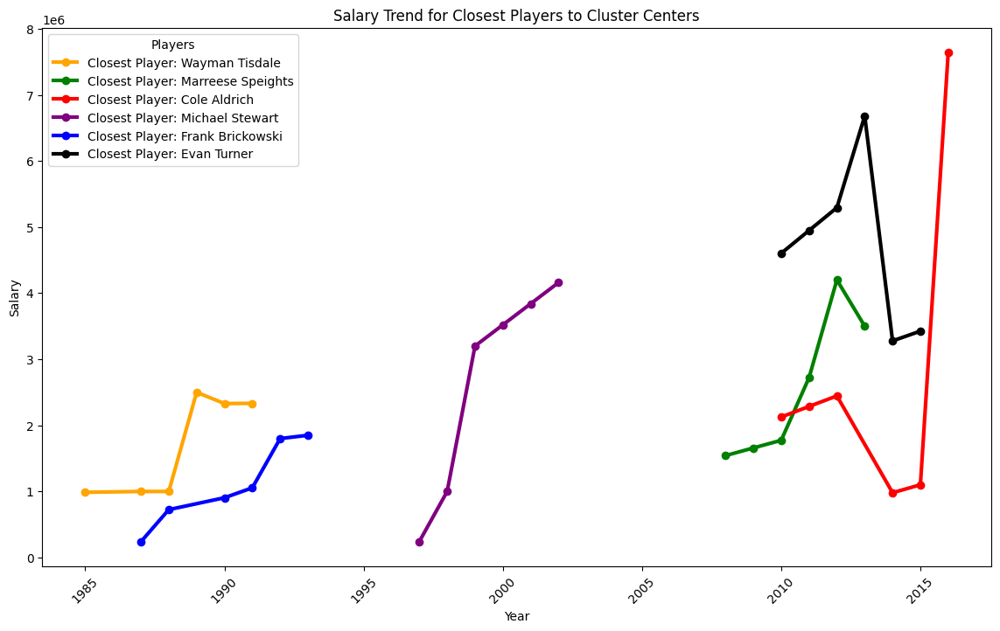

In [223]:
# 先从 LEAGUE_ID 中提取年份（例如 2007-08 中提取 2007）
df['year'] = df['LEAGUE_ID'].str.split('-').str[0].astype(int)

# 计算每个球员与其所在簇的聚类中心之间的欧氏距离，并找出离聚类中心最近的球员
plt.figure(figsize=(14, 8))

# 定义每个簇的颜色
cluster_colors = ['orange', 'green', 'red', 'purple', 'blue', 'black']

for cluster_id in np.unique(clusters):
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])

    # 获取该簇的聚类中心
    center_vector = cluster_centers[cluster_id]

    # 计算每个球员的L2范数向量与聚类中心的欧氏距离
    distances = np.linalg.norm(cluster_vectors - center_vector, axis=1)

    # 找到距离聚类中心最近的球员
    closest_player_idx = np.argmin(distances)
    closest_player = cluster_players.iloc[closest_player_idx]
    closest_player_data = df[df['PLAYER_NAME'] == closest_player].sort_values(by='year')
    
    # 提取该球员的工资数据（前六年）
    closest_player_salary = closest_player_data[['year', 'year_salary']].head(6)

    # 为每个球员分配颜色
    player_color = cluster_colors[cluster_id % len(cluster_colors)]

    # 绘制该球员的折线图
    plt.plot(closest_player_salary['year'], closest_player_salary['year_salary'], label=f'Closest Player: {closest_player}', color=player_color, linewidth=3, marker='o')

# 添加图例和标签
plt.title("Salary Trend for Closest Players to Cluster Centers")
plt.xlabel("Year")
plt.ylabel("Salary")

# 调整x轴标签的角度以避免重叠
plt.xticks(rotation=45)

plt.legend(title="Players", loc='upper left', fontsize=10)
plt.savefig(f"kmeans_6_salary_trend.jpg")
# 显示图形
plt.show()


In [177]:
file = 'processed_players_season_stats.csv'
df_players = pd.read_csv(file)
df_combined = pd.merge(df_clusters, df_players, left_on='Player', right_on='PLAYER_NAME', how='left')

# 2. 按照簇进行分组，计算每个簇的最大值、最小值、均值和中位数
cluster_stats = df_combined.groupby('Cluster').agg({
    'PTS': ['max', 'min', 'mean', 'median'],  # 对PTS计算最大、最小、均值和中位数
    'year_salary': ['max', 'min', 'mean', 'median'],  # 对salary计算最大、最小、均值和中位数
    # 你还可以加入更多的属性，如 'career_PTS', 'career_AST' 等
}).reset_index()

# 3. 打印统计结果
print(cluster_stats)

  Cluster   PTS                        year_salary                         \
            max min        mean median         max      min          mean   
0       0  2762   0  574.898230  426.5  17059727.0  26007.0  4.137732e+06   
1       1  3426   2  668.355191  580.0  23775506.0  35232.0  3.670814e+06   
2       2  2832   0  770.266069  714.0  30453805.0  30000.0  4.570997e+06   
3       3  2800   0  596.244186  459.0  14625000.0  53465.0  2.459637e+06   
4       4  3940   6  688.734091  568.5  26243760.0   5000.0  4.179605e+06   
5       5  3022   4  541.860697  413.0  17131148.0  72234.0  2.328721e+06   

              
      median  
0  3387980.0  
1  2311200.0  
2  2475000.0  
3  1225000.0  
4  2505460.0  
5  1330000.0  


In [163]:
# 6 clusters
# 3 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

X = []  # 特征：前三年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 添加到特征列表 X
    X.append(player_front_three)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    
    # 使用 enumerate 遍历聚类中心
    for cluster_id, center in enumerate(cluster_centers):
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])  # 使用前 3 年部分进行比较
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为 numpy 数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用 LogisticRegressionCV 进行交叉验证，liblinear 优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")

/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated clas

Cross-Validation Accuracy: nan ± nan


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
2 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/intern/miniconda3/envs/shujun/lib/python3.

In [180]:
# 6 clusters
# 4 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:4]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    
    # 使用enumerate遍历聚类中心
    for cluster_id, center in enumerate(cluster_centers):
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:4])  # 使用前五年部分进行比较
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=3, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=3, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: nan ± nan


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
2 fits failed

In [184]:
# 6 clusters
# 5 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    
    # 使用enumerate遍历聚类中心
    for cluster_id, center in enumerate(cluster_centers):
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])  # 使用前五年部分进行比较
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.9772727272727273 ± 0.020327890704543525


len eligible_players 220


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


每个簇的球员数量：
Cluster
0    93
2    46
3    41
1    40
Name: count, dtype: int64


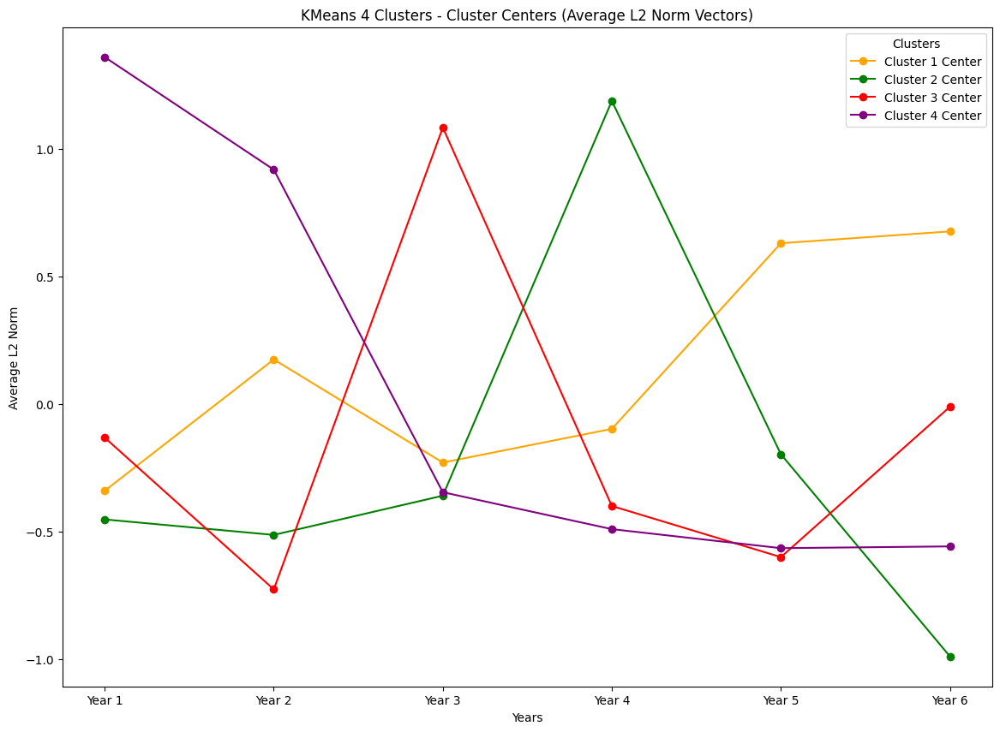

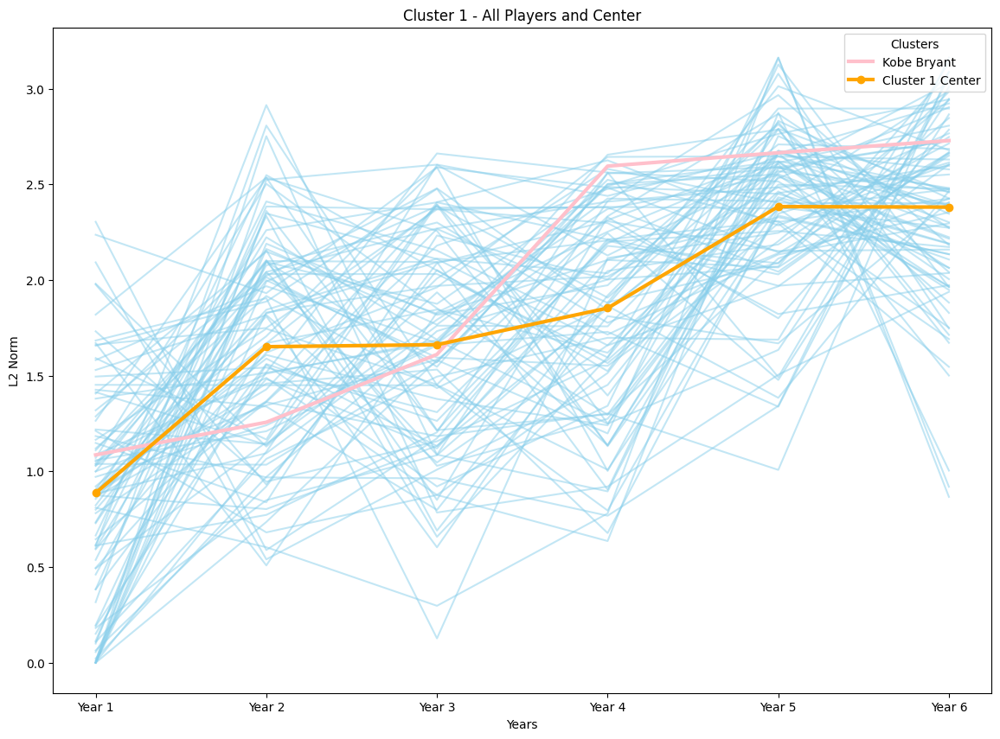

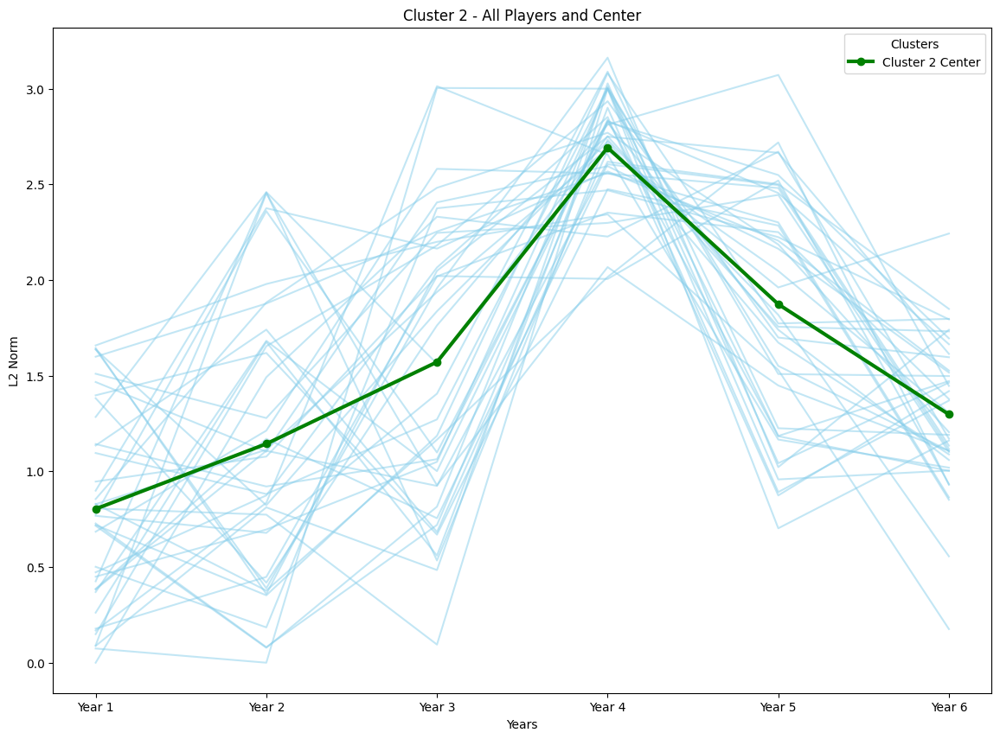

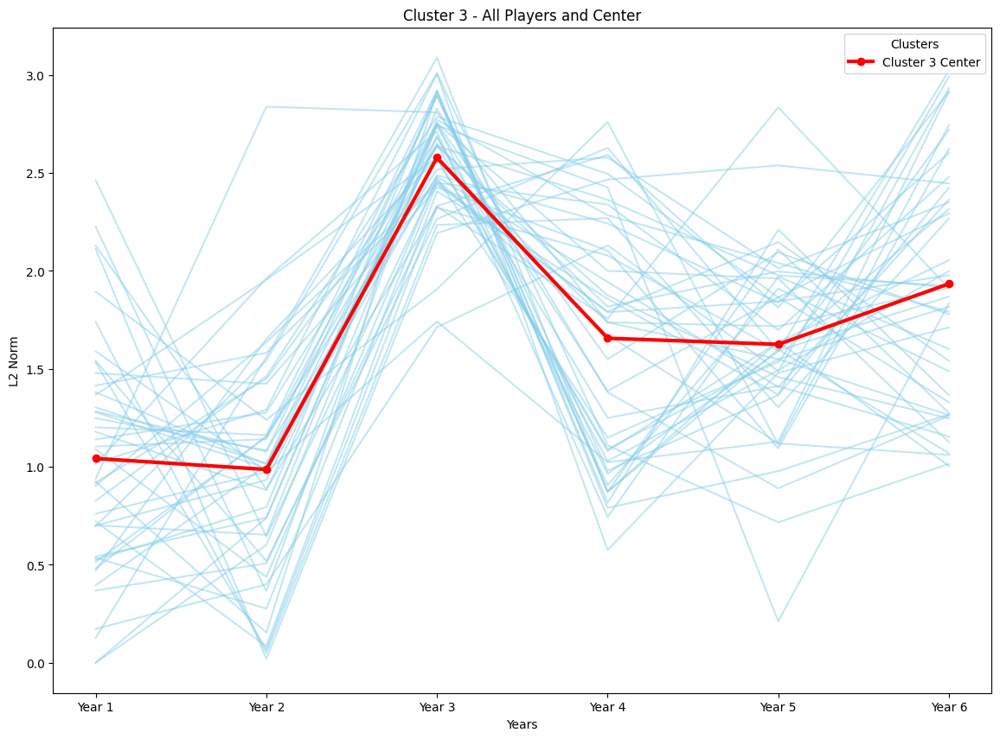

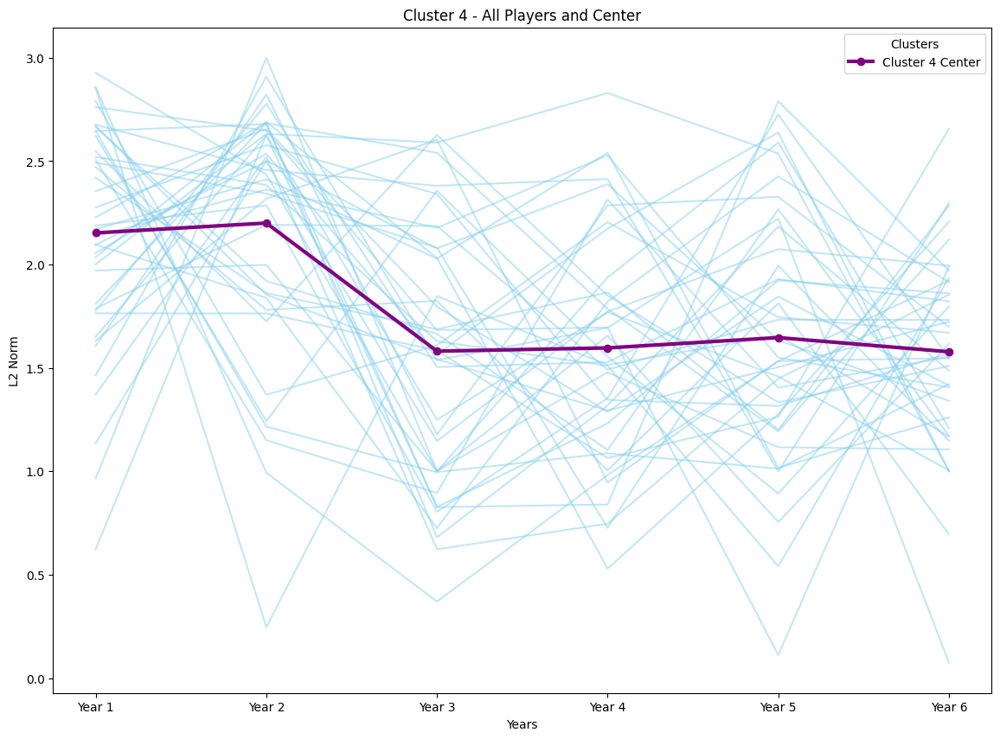

In [255]:
#kmeans 4 clusters
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans


import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 读取数据
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 选择需要进行聚类的列
columns_for_clustering = [
    'FG_PCT',  'FG3_PCT', 'FT_PCT', 'OREB', 'DREB', 
    'REB', 'STL', 'BLK', 'PTS', 'year_salary'
]

# 过滤出打了6年及以上的球员
player_counts = df['PLAYER_NAME'].value_counts()
eligible_players = player_counts[player_counts >= 6].index
df_filtered = df[df['PLAYER_NAME'].isin(eligible_players)]

print('len eligible_players', len(eligible_players))
# 计算每个球员的每个属性归一化并计算L2范数
scaler = MinMaxScaler()

# 用一个字典存储每个球员的6年长向量
player_vectors = {}

for player in eligible_players:
    # 获取该球员的6年数据（按年份排序）
    player_data = df_filtered[df_filtered['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    if len(player_data) >= 6:  # 确保该球员有6年数据
        # 提取前6年的数据
        player_data = player_data.iloc[:6][columns_for_clustering]
        
        # 对每个属性进行归一化
        player_data_normalized = scaler.fit_transform(player_data)
        
        # 计算L2范数，得到一个6年的向量
        l2_norm_vector = np.linalg.norm(player_data_normalized, axis=1)
        
        # 存储每个球员的L2范数向量
        player_vectors[player] = l2_norm_vector


# 1. 整理数据
# 将每个球员的6年L2范数向量存储到DataFrame中
vectors_list = []
players = []

for player, vector in player_vectors.items():
    # 记录球员名字
    players.append(player)
    # 将6年L2范数向量合并为一个向量
    vectors_list.append(vector)

# 创建一个DataFrame，列为6个年限的L2范数
df_vectors = pd.DataFrame(vectors_list)

# 2. 标准化
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_vectors)

# 3. 使用KMeans聚类
n_clusters = 4 # 你可以根据需要调整簇的数量
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(df_scaled)

# 4. 打印每个簇的球员数量
df_clusters = pd.DataFrame({
    'Player': players,
    'Cluster': clusters
})

cluster_counts = df_clusters['Cluster'].value_counts()
print("每个簇的球员数量：")
print(cluster_counts)

# 5. 绘制每个簇的图
cluster_colors = ['orange', 'green', 'red', 'purple', 'blue', 'black']

# 获取KMeans的聚类中心
cluster_centers = kmeans.cluster_centers_

# 绘制每个簇的聚类中心的折线图
plt.figure(figsize=(14, 10))
years = [f'Year {i+1}' for i in range(6)]

# 绘制每个簇的聚类中心，并指定颜色
for cluster_id, center_vector in enumerate(cluster_centers):
    plt.plot(years, center_vector, label=f'Cluster {cluster_id+1} Center', marker='o', color=cluster_colors[cluster_id])

# 添加图例和标签
plt.title("KMeans 4 Clusters - Cluster Centers (Average L2 Norm Vectors)")
plt.xlabel("Years")
plt.ylabel("Average L2 Norm")
plt.savefig(f"kmeans_4_center.jpg")

plt.legend(title="Clusters", loc="upper right")

# 显示图形
plt.show()

kobe_name = 'Kobe Bryant'
kobe_cluster = df_clusters[df_clusters['Player'] == kobe_name]['Cluster'].iloc[0]

# 6. 绘制每个簇内的所有球员的折线
center_vector_original_scales=[]
for cluster_id in np.unique(clusters):
    plt.figure(figsize=(14, 10))
    
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])

    # 绘制该簇内所有球员的L2范数向量，使用天蓝色
    for vector in cluster_vectors:
        plt.plot(years, vector, color='skyblue', alpha=0.5)  # 使用天蓝色，透明度0.5
    
    # 获取该簇的聚类中心并还原到原始数据的尺度
    center_vector = cluster_centers[cluster_id]
    center_vector_original_scale = scaler.inverse_transform(center_vector.reshape(1, -1)).flatten()
    center_vector_original_scales.append(center_vector_original_scale)
    if cluster_id == kobe_cluster:
        # 如果是Kobe Bryant所在的簇，用粉色画出他的L2范数向量
        kobe_vector = player_vectors[kobe_name]
        plt.plot(years, kobe_vector, label=f'{kobe_name}', color='pink', linewidth=3)
    
    # 绘制该簇的聚类中心（使用指定颜色）
    plt.plot(years, center_vector_original_scale, label=f'Cluster {cluster_id+1} Center', marker='o', color=cluster_colors[cluster_id], linewidth=3)

    # 添加图例和标签
    plt.title(f"Cluster {cluster_id+1} - All Players and Center")
    plt.xlabel("Years")
    plt.ylabel("L2 Norm")
    plt.legend(title="Clusters", loc="upper right")
    plt.savefig(f"kmeans_4_center_{cluster_id}.jpg")

    # 显示图形
    plt.show()

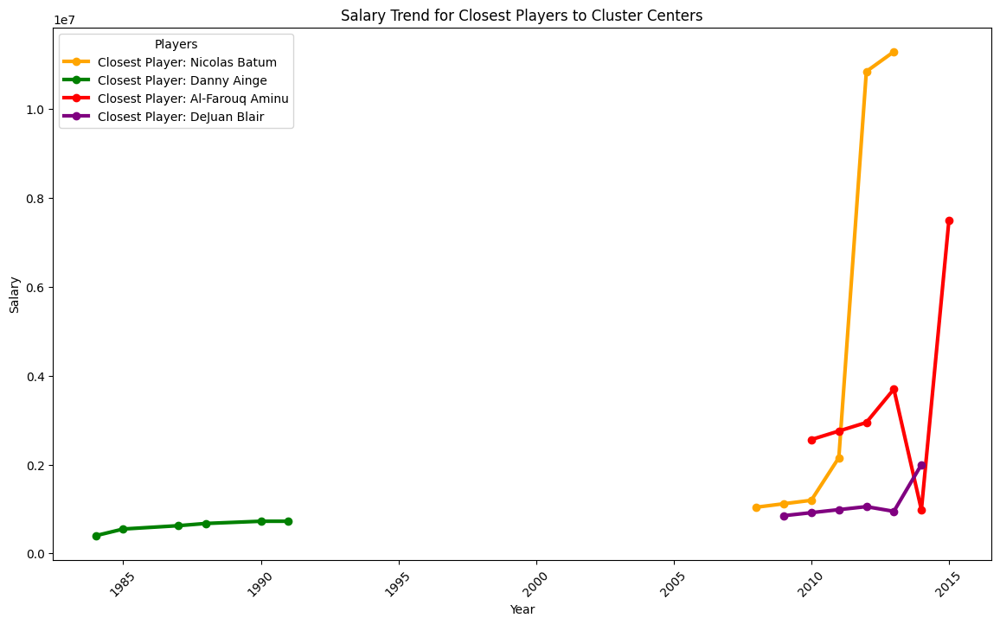

In [265]:
# 先从 LEAGUE_ID 中提取年份（例如 2007-08 中提取 2007）
df['year'] = df['LEAGUE_ID'].str.split('-').str[0].astype(int)

# 计算每个球员与其所在簇的聚类中心之间的欧氏距离，并找出离聚类中心最近的球员
plt.figure(figsize=(14, 8))

# 定义每个簇的颜色
cluster_colors = ['orange', 'green', 'red', 'purple', 'blue', 'black']

for cluster_id in np.unique(clusters):
    # 获取该簇内的所有球员
    cluster_players = df_clusters[df_clusters['Cluster'] == cluster_id]['Player']
    
    # 获取该簇内所有球员的L2范数向量
    cluster_vectors = np.array([player_vectors[player] for player in cluster_players])

    # 获取该簇的聚类中心
    center_vector = cluster_centers_rescaled[cluster_id]

    # 计算每个球员的L2范数向量与聚类中心的欧氏距离
    distances = np.linalg.norm(cluster_vectors - center_vector, axis=1)

    # 找到距离聚类中心最近的球员
    closest_player_idx = np.argmin(distances)
    closest_player = cluster_players.iloc[closest_player_idx]
    closest_player_data = df[df['PLAYER_NAME'] == closest_player].sort_values(by='year')
    
    # 提取该球员的工资数据（前六年）
    closest_player_salary = closest_player_data[['year', 'year_salary']].head(6)

    # 为每个球员分配颜色
    player_color = cluster_colors[cluster_id % len(cluster_colors)]

    # 绘制该球员的折线图
    plt.plot(closest_player_salary['year'], closest_player_salary['year_salary'], label=f'Closest Player: {closest_player}', color=player_color, linewidth=3, marker='o')

# 添加图例和标签
plt.title("Salary Trend for Closest Players to Cluster Centers")
plt.xlabel("Year")
plt.ylabel("Salary")

# 调整x轴标签的角度以避免重叠
plt.xticks(rotation=45)

plt.legend(title="Players", loc='upper left', fontsize=10)
plt.savefig(f"kmeans_4_salary_trend.jpg")
# 显示图形
plt.show()


In [257]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 读取数据
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 选择需要进行聚类的列
columns_for_clustering = [
    'FG_PCT', 'FG3_PCT', 'FT_PCT', 'OREB', 'DREB', 
    'REB', 'STL', 'BLK', 'PTS', 'year_salary'
]

# 提取年份并转换为整数
df['year'] = df['LEAGUE_ID'].str.split('-').str[0].astype(int)

# 过滤出从2010年开始的数据
df_filtered = df[(df['year'] >= 2005)]

# 统计每个球员的赛季数量
player_counts = df_filtered['PLAYER_NAME'].value_counts()

# 筛选出打了大于等于5年的球员
eligible_players = player_counts[player_counts >= 5].index

# 过滤出这些球员的数据
df_filtered = df_filtered[df_filtered['PLAYER_NAME'].isin(eligible_players)]

# 输出符合条件的球员数量
print('len eligible_players', len(eligible_players))

# 计算每个球员的每个属性归一化并计算L2范数
scaler = MinMaxScaler()

# 用一个字典存储每个球员的前五年向量
yr5_player_vectors = {}

for player in eligible_players:
    # 获取该球员的多年的数据（按年份排序）
    player_data = df_filtered[df_filtered['PLAYER_NAME'] == player].sort_values(by='year')
    
    if len(player_data) >= 5:  # 确保该球员有至少5年数据
        # 提取前5年的数据
        player_data = player_data.head(5)[columns_for_clustering]
        
        # 对每个属性进行归一化
        player_data_normalized = scaler.fit_transform(player_data)
        
        # 计算L2范数，得到一个5年的向量
        l2_norm_vector = np.linalg.norm(player_data_normalized, axis=1)
        
        # 存储每个球员的L2范数向量
        yr5_player_vectors[player] = l2_norm_vector

# yr5_player_vectors 现在包含了所有符合条件的球员的5年L2范数向量


len eligible_players 134


In [258]:
yr5_player_vectors

{'Jose Calderon': array([0.8272239 , 1.46199311, 2.78703049, 2.52833798, 1.9218517 ]),
 'Matt Barnes': array([2.00536996, 2.        , 2.02693177, 1.72953752, 1.85159746]),
 'Andrew Bogut': array([1.62664781, 1.72222077, 2.36633376, 1.0580094 , 2.47780978]),
 'Michael Beasley': array([2.35054672, 2.61085427, 2.3636779 , 1.39351486, 1.2466305 ]),
 'Anthony Tolliver': array([0.07416813, 0.        , 3.00392051, 3.00002379, 1.55127897]),
 'Tony Allen': array([1.5281384 , 1.72267002, 2.62576334, 1.86039665, 2.09149909]),
 'Jason Terry': array([1.88509416, 2.32609736, 1.74582193, 2.18484603, 1.46717007]),
 'Carmelo Anthony': array([1.8022051 , 1.17986969, 2.76532231, 1.5361523 , 2.01200118]),
 'Trevor Ariza': array([2.33082706, 0.66852437, 1.80035574, 1.6553172 , 2.40725007]),
 "Amar'e Stoudemire": array([1.        , 2.54658436, 2.62521376, 2.0996236 , 2.48208671]),
 'Corey Brewer': array([1.63842079, 0.38907346, 1.9572822 , 3.16227766, 1.022287  ]),
 'J.J. Barea': array([0.09375   , 1.519554

In [260]:
cluster_centers

array([[-0.33970119,  0.17477732, -0.22916606, -0.09724086,  0.63001332,
         0.67629109],
       [-0.45195805, -0.51263906, -0.35901777,  1.18750513, -0.19667989,
        -0.98860235],
       [-0.13151145, -0.72598323,  1.08330906, -0.39928191, -0.59955861,
        -0.01063771],
       [ 1.35902582,  0.91820733, -0.34534298, -0.48999603, -0.56449627,
        -0.55760103]])

In [259]:
center_vector_original_scales

[array([0.88730909, 1.6515614 , 1.66212826, 1.85329511, 2.38385407,
        2.38118765]),
 array([0.80367679, 1.14394234, 1.57150682, 2.69233665, 1.87370758,
        1.29762577]),
 array([1.04241219, 0.98639945, 2.57808369, 1.65603823, 1.62509399,
        1.93411408]),
 array([2.15287493, 2.20054343, 1.58105024, 1.59679467, 1.64673071,
        1.57813418])]

In [262]:
import numpy as np

cluster_centers_rescaled = np.array([
    [0.88730909, 1.6515614 , 1.66212826, 1.85329511, 2.38385407, 2.38118765],
    [0.80367679, 1.14394234, 1.57150682, 2.69233665, 1.87370758, 1.29762577],
    [1.04241219, 0.98639945, 2.57808369, 1.65603823, 1.62509399, 1.93411408],
    [2.15287493, 2.20054343, 1.58105024, 1.59679467, 1.64673071, 1.57813418]
])
print(type(cluster_centers_rescaled))

print(cluster_centers_rescaled)


<class 'numpy.ndarray'>
[[0.88730909 1.6515614  1.66212826 1.85329511 2.38385407 2.38118765]
 [0.80367679 1.14394234 1.57150682 2.69233665 1.87370758 1.29762577]
 [1.04241219 0.98639945 2.57808369 1.65603823 1.62509399 1.93411408]
 [2.15287493 2.20054343 1.58105024 1.59679467 1.64673071 1.57813418]]


In [263]:
player_cluster_labels = {}

# 遍历所有球员的 L2 范数向量
for player, vector in yr5_player_vectors.items():
    # 计算该球员到每个聚类中心的距离（使用欧氏距离）
    distances = [np.linalg.norm(vector - center[:5]) for center in cluster_centers_rescaled]
    
    # 将球员分配到距离最近的簇（找到距离最小的聚类中心的索引）
    closest_cluster = np.argmin(distances)
    
    # 存储球员的簇标签
    player_cluster_labels[player] = closest_cluster

# 打印一些球员及其分配的簇标签
for player, cluster_label in list(player_cluster_labels.items())[:10]:  # 只打印前10个球员
    print(f"Player: {player}, Assigned Cluster: {cluster_label}")

Player: Jose Calderon, Assigned Cluster: 2
Player: Matt Barnes, Assigned Cluster: 3
Player: Andrew Bogut, Assigned Cluster: 0
Player: Michael Beasley, Assigned Cluster: 3
Player: Anthony Tolliver, Assigned Cluster: 2
Player: Tony Allen, Assigned Cluster: 2
Player: Jason Terry, Assigned Cluster: 3
Player: Carmelo Anthony, Assigned Cluster: 2
Player: Trevor Ariza, Assigned Cluster: 2
Player: Amar'e Stoudemire, Assigned Cluster: 0


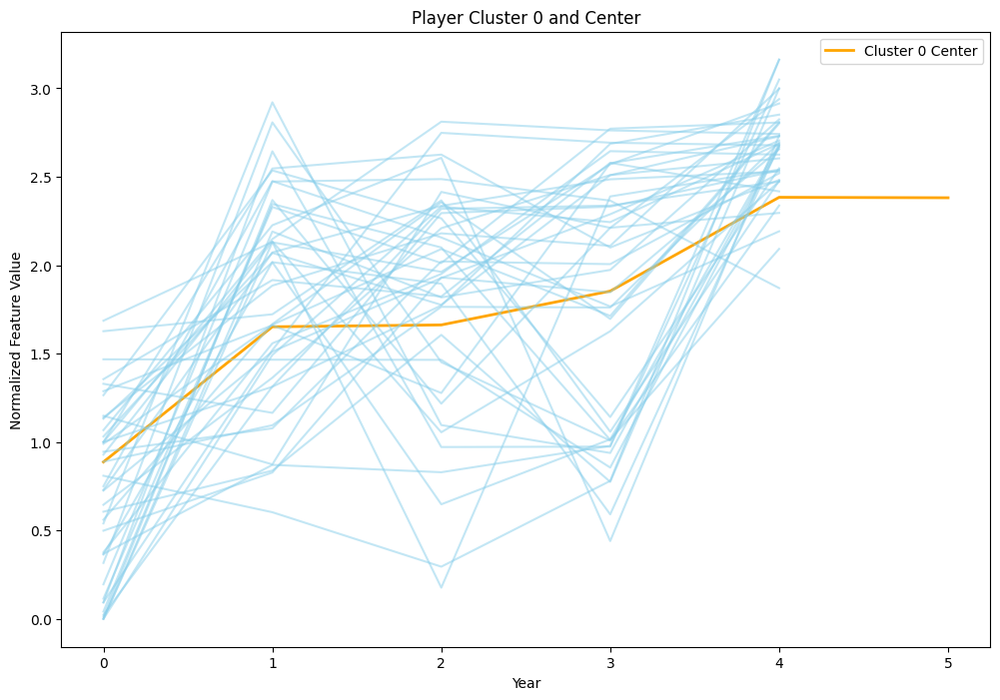

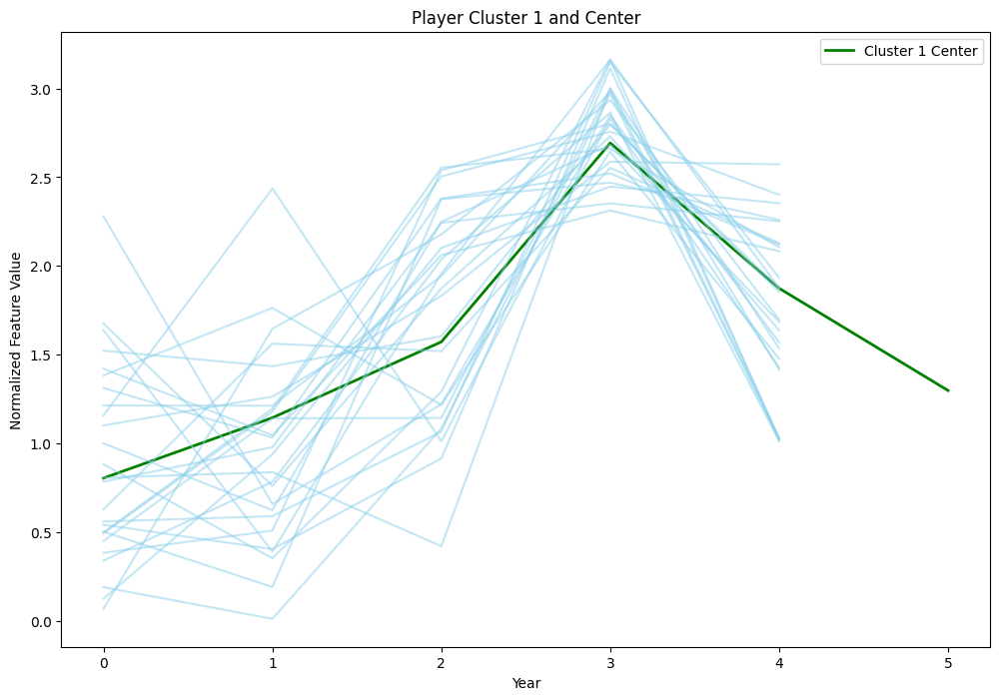

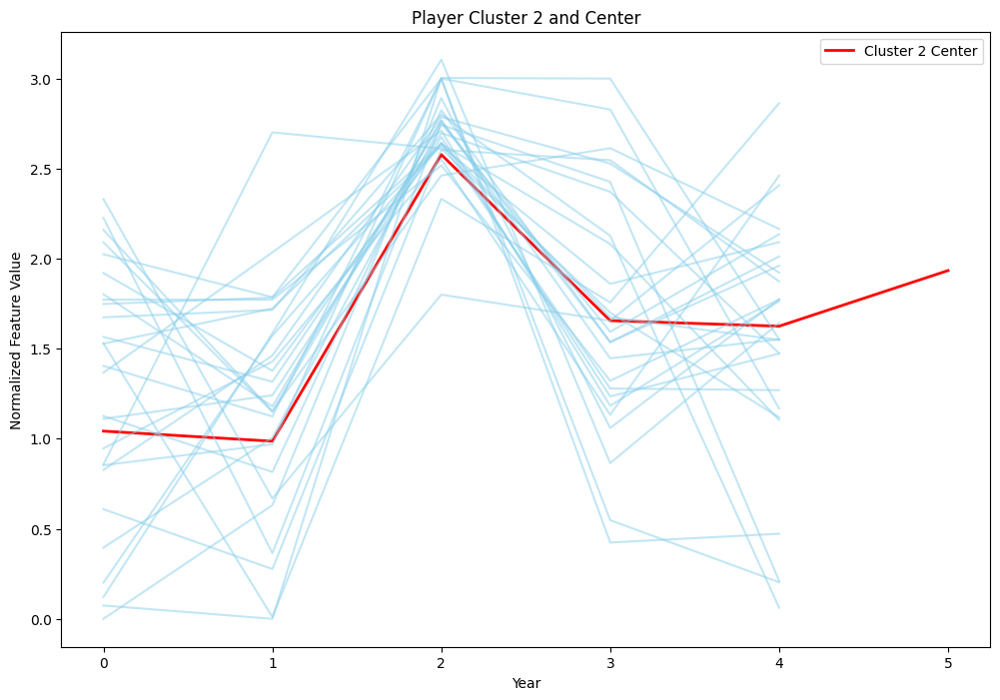

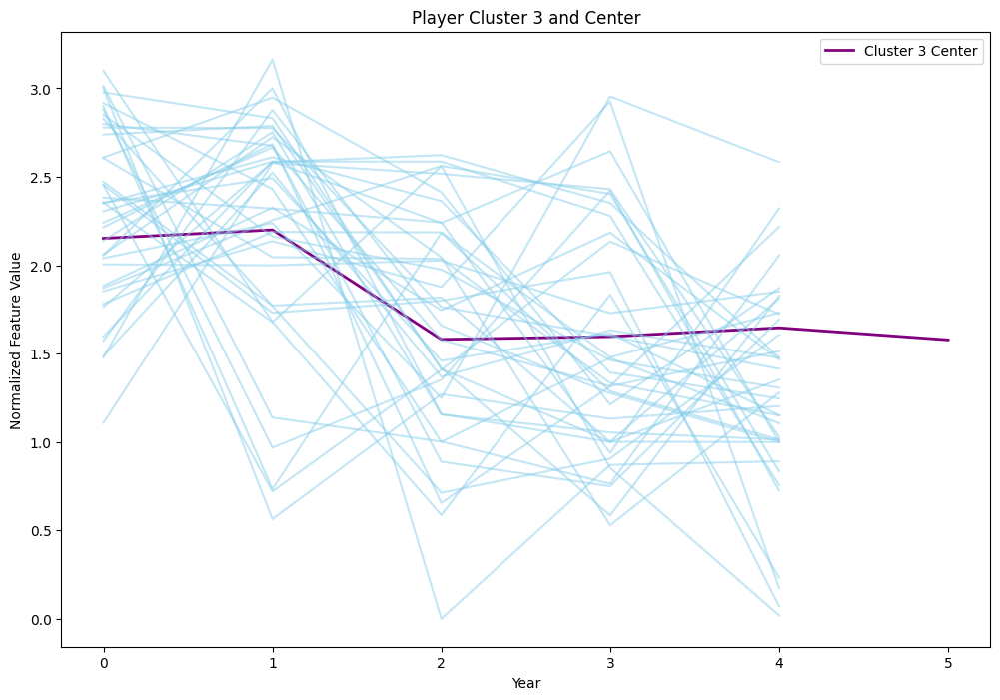

In [264]:
import matplotlib.pyplot as plt

# 预定义颜色：每个聚类中心的颜色
cluster_colors = ['orange', 'green', 'red', 'purple']
player_color = 'skyblue'  # 球员的颜色

# 根据簇标签将球员分配到各个簇
clustered_players = {i: [] for i in range(len(cluster_centers))}
for player, cluster_label in player_cluster_labels.items():
    clustered_players[cluster_label].append(player)


for cluster_id, players_in_cluster in clustered_players.items():
    # 创建图形窗口
    plt.figure(figsize=(12, 8))

    # # 获取该簇的聚类中心并还原到原始数据尺度
    # cluster_center = cluster_centers[cluster_id]
    
    # # 绘制聚类中心的折线图
    # plt.plot(range(6), cluster_center, label=f'Cluster {cluster_id} Center', color=cluster_colors[cluster_id], linewidth=2)
    center_vector_original_scale=center_vector_original_scales[cluster_id]
    # 绘制聚类中心的折线图
    plt.plot(range(6), center_vector_original_scale, label=f'Cluster {cluster_id} Center', color=cluster_colors[cluster_id], linewidth=2)

    # 为该簇的每个球员绘制折线图
    for player in players_in_cluster:
        player_vector = yr5_player_vectors[player]
        plt.plot(range(5), player_vector, color=player_color, alpha=0.5)  # alpha 设置透明度

    # 设置每个图的标题、标签和图例
    plt.title(f'Player Cluster {cluster_id} and Center')
    plt.xlabel('Year')
    plt.ylabel('Normalized Feature Value')
    plt.legend()
    plt.savefig(f"kmeans_4_predict_center_{cluster_id}.jpg")
    # 显示每个图
    plt.show()


In [190]:
# 4 clusters
# 3 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:3]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    
    # 使用enumerate遍历聚类中心
    for cluster_id, center in enumerate(cluster_centers):
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:3])  # 使用前五年部分进行比较
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated clas

Cross-Validation Accuracy: 0.981818181818182 ± 0.017007533576245175


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


In [189]:
# 4 clusters
# 4 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:4]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    
    # 使用enumerate遍历聚类中心
    for cluster_id, center in enumerate(cluster_centers):
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:4])  # 使用前五年部分进行比较
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.8181818181818181 ± 0.04545454545454546


/home/intern/miniconda3/envs/shujun/lib/python3.9/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


In [187]:
# 4 clusters
# 5 years cross valid
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# 假设 df 已经加载并且 player_vectors 和 cluster_centers 变量已存在

# 获取球员的前五年数据和对应的簇标签
X = []  # 特征：前五年数据
y = []  # 标签：预测簇

for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 添加到特征列表X
    X.append(player_front_five)
    
    # 获取球员所属的簇（通过计算与聚类中心的距离找到最小距离簇）
    distances = {}
    
    # 使用enumerate遍历聚类中心
    for cluster_id, center in enumerate(cluster_centers):
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])  # 使用前五年部分进行比较
    
    # 找到最小距离的簇作为标签
    predicted_cluster = min(distances, key=distances.get)
    y.append(predicted_cluster)

# 将数据转换为numpy数组
X = np.array(X)
y = np.array(y)

# 特征标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用LogisticRegressionCV进行交叉验证，liblinear优化方法
log_reg_cv = LogisticRegressionCV(cv=5, solver='liblinear', multi_class='ovr', max_iter=1000)

# 计算交叉验证的准确率
cross_val_accuracy = cross_val_score(log_reg_cv, X_scaled, y, cv=5, scoring='accuracy')

# 输出交叉验证的准确率结果
print(f"Cross-Validation Accuracy: {cross_val_accuracy.mean()} ± {cross_val_accuracy.std()}")


Cross-Validation Accuracy: 0.9454545454545455 ± 0.03692744729379984


In [84]:
# 6 clusters
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 计算与每个簇的聚类中心前三年部分的距离
    distances = {}
    for cluster_id, center in enumerate(cluster_centers):  # cluster_centers是二维数组
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第4、5、6年（预测值）
    predicted_years_4_6 = cluster_centers[predicted_cluster][3:6]
    
    # 获取该球员的真实第4、5、6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    # 确保数据长度足够并且选择正确的列
    if len(player_data) >= 6:
        true_years_4_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[3:6]['year_salary'].values
        
        # 存储真实值和预测值
        true_values.extend(true_years_4_6)
        predictions.extend(predicted_years_4_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 27537146290490.71
Prediction Accuracy: 0.2196969696969697


In [79]:
# 4 clusters
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前三年向量
    player_front_three = vector[:3]
    
    # 计算与每个簇的聚类中心前三年部分的距离
    distances = {}
    for cluster_id, center in enumerate(cluster_centers):  # cluster_centers是二维数组
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_three - center[:3])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第4、5、6年（预测值）
    predicted_years_4_6 = cluster_centers[predicted_cluster][3:6]
    
    # 获取该球员的真实第4、5、6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    # 确保数据长度足够并且选择正确的列
    if len(player_data) >= 6:
        true_years_4_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[3:6]['year_salary'].values
        
        # 存储真实值和预测值
        true_values.extend(true_years_4_6)
        predictions.extend(predicted_years_4_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 27537144812784.375
Prediction Accuracy: 0.21818181818181817


In [85]:
# 6 clusters
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前四年向量
    player_front_four = vector[:4]
    
    # 计算与每个簇的聚类中心前四年部分的距离
    distances = {}
    for cluster_id, center in enumerate(cluster_centers):  # cluster_centers是二维数组
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_four - center[:4])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第5、6年（预测值）
    predicted_years_5_6 = cluster_centers[predicted_cluster][4:6]
    
    # 获取该球员的真实第5、6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    # 确保数据长度足够并且选择正确的列
    if len(player_data) >= 6:
        true_years_5_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[4:6]['year_salary'].values
        
        # 存储真实值和预测值
        true_values.extend(true_years_5_6)
        predictions.extend(predicted_years_5_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 35651219656420.4
Prediction Accuracy: 0.18409090909090908


In [80]:
# 4 clusters
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前四年向量
    player_front_four = vector[:4]
    
    # 计算与每个簇的聚类中心前四年部分的距离
    distances = {}
    for cluster_id, center in enumerate(cluster_centers):  # cluster_centers是二维数组
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_four - center[:4])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第5、6年（预测值）
    predicted_years_5_6 = cluster_centers[predicted_cluster][4:6]
    
    # 获取该球员的真实第5、6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    # 确保数据长度足够并且选择正确的列
    if len(player_data) >= 6:
        true_years_5_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[4:6]['year_salary'].values
        
        # 存储真实值和预测值
        true_values.extend(true_years_5_6)
        predictions.extend(predicted_years_5_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 35651222490052.9
Prediction Accuracy: 0.18181818181818182


In [86]:
# 6 clusters
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 计算与每个簇的聚类中心前五年部分的距离
    distances = {}
    for cluster_id, center in enumerate(cluster_centers):  # cluster_centers是二维数组
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第6年（预测值）
    predicted_year_6 = cluster_centers[predicted_cluster][5]
    
    # 获取该球员的真实第6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    # 确保数据长度足够并且选择正确的列
    if len(player_data) >= 6:
        true_year_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[5]['year_salary']
        
        # 存储真实值和预测值
        true_values.append(true_year_6)
        predictions.append(predicted_year_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 39196880757273.12
Prediction Accuracy: 0.19545454545454546


In [81]:
# 4 clusters
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# 存储真实值和预测值
predictions = []
true_values = []

# 对每个球员进行处理
for player, vector in player_vectors.items():
    # 获取球员的前五年向量
    player_front_five = vector[:5]
    
    # 计算与每个簇的聚类中心前五年部分的距离
    distances = {}
    for cluster_id, center in enumerate(cluster_centers):  # cluster_centers是二维数组
        # 计算欧几里得距离
        distances[cluster_id] = np.linalg.norm(player_front_five - center[:5])
    
    # 找到最小距离的簇
    predicted_cluster = min(distances, key=distances.get)
    
    # 获取该簇的聚类中心的第6年（预测值）
    predicted_year_6 = cluster_centers[predicted_cluster][5]
    
    # 获取该球员的真实第6年数据
    player_data = df[df['PLAYER_NAME'] == player].sort_values(by='LEAGUE_ID')
    
    # 确保数据长度足够并且选择正确的列
    if len(player_data) >= 6:
        true_year_6 = player_data[['LEAGUE_ID', 'year_salary']].iloc[5]['year_salary']
        
        # 存储真实值和预测值
        true_values.append(true_year_6)
        predictions.append(predicted_year_6)

# 计算均方误差
mse = mean_squared_error(true_values, predictions)
print(f"Mean Squared Error: {mse}")

# 计算预测准确率，可以根据某个误差阈值来定义准确率
accuracy = np.mean(np.abs(np.array(true_values) - np.array(predictions)) < 1000000)  # 举例：误差小于100万视为准确
print(f"Prediction Accuracy: {accuracy}")


Mean Squared Error: 39196879428856.48
Prediction Accuracy: 0.19545454545454546


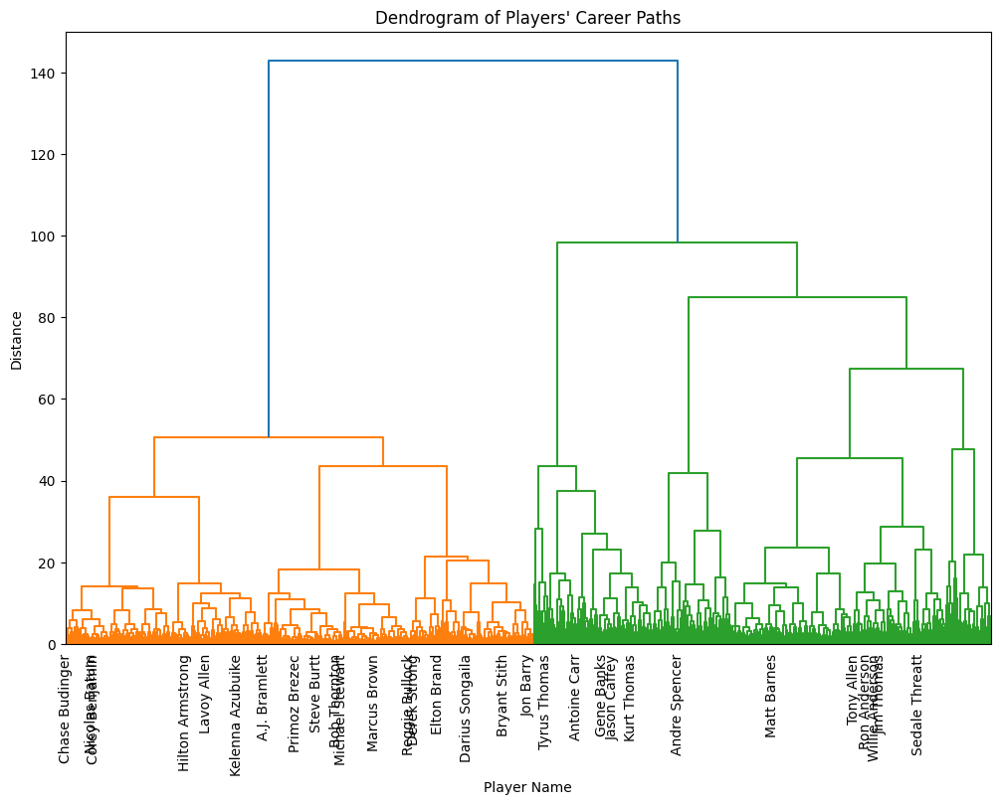

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage

# 读取数据
file = 'processed_players_season_stats.csv'
df = pd.read_csv(file)

# 选择需要进行聚类的列（忽略 PLAYER_NAME 和其他非数值列）
columns_for_clustering = [
     'FGM', 'FG_PCT', 'FG3M', 'FG3_PCT', 
    'FTM', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK', 
    'PTS', 'AGE', 'year_salary'
]
df_clustering = df[columns_for_clustering]

# 数据标准化（标准化对于聚类很重要）
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_clustering)

# 进行层次聚类
Z = linkage(df_scaled, method='ward')

# 绘制树状图（Dendrogram）

# 设置每隔 n 个球员显示一个名字
n_skip = 100  # 可以根据需要调整此值

# 创建简化后的球员名字，只保留每隔 n_skip 个球员
player_names = df['PLAYER_NAME'].values
simplified_names = [player_names[i] if i % n_skip == 0 else "" for i in range(len(player_names))]

# 绘制树状图
plt.figure(figsize=(12, 8))
dendrogram(Z, labels=simplified_names, leaf_rotation=90, leaf_font_size=10)
plt.title("Dendrogram of Players' Career Paths")
plt.xlabel("Player Name")
plt.ylabel("Distance")
plt.show()


总共分了 4 个簇
每个簇的球员数量：
cluster
1    1482
4     818
2     375
3     249
Name: count, dtype: int64


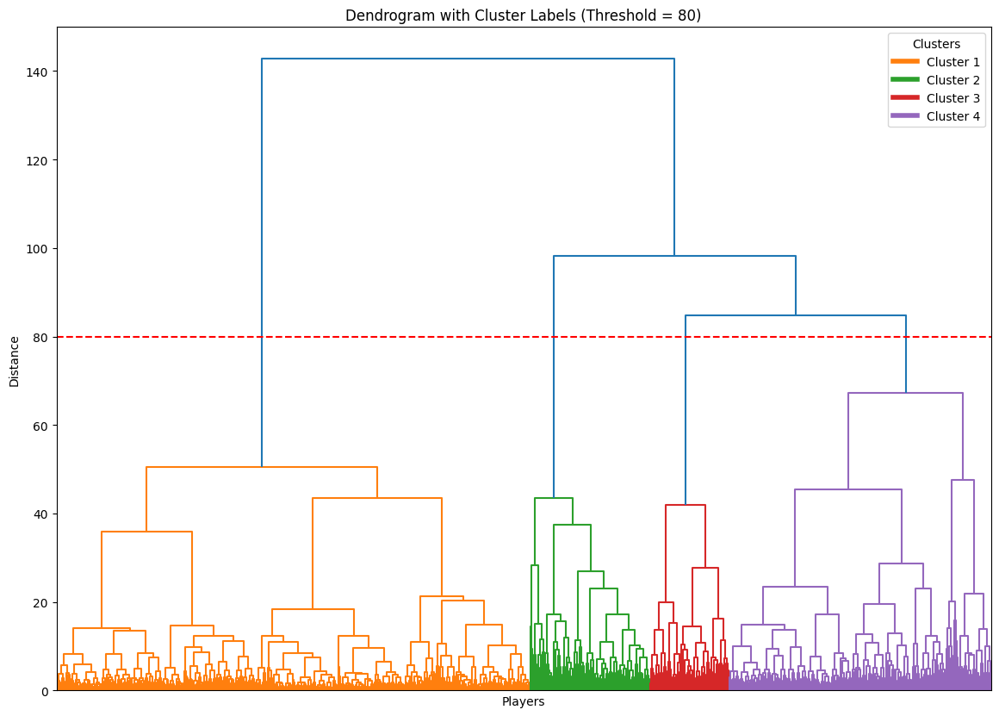

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from matplotlib.lines import Line2D

# 设定距离阈值
distance_threshold = 80
clusters = fcluster(Z, t=distance_threshold, criterion='distance')
df['cluster'] = clusters

# 打印分了多少个簇
num_clusters = len(set(clusters))
print(f"总共分了 {num_clusters} 个簇")

# 查看每个簇的球员数量
cluster_counts = df['cluster'].value_counts()
print("每个簇的球员数量：")
print(cluster_counts)

# -------- 绘制树状图 --------
plt.figure(figsize=(14, 10))
dendro = dendrogram(
    Z,
    labels=df['PLAYER_NAME'].values,
    leaf_rotation=90,
    leaf_font_size=8,
    color_threshold=distance_threshold,
    no_labels=True  # 不画名字
)

plt.title(f"Dendrogram with Cluster Labels (Threshold = {distance_threshold})")
plt.xlabel("Players")
plt.ylabel("Distance")
plt.axhline(y=distance_threshold, c='red', linestyle='--')

cluster_colors = ['C1', 'C2', 'C3', 'C4']
cluster_labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']

legend_elements = [
    Line2D([0], [0], color=color, lw=4, label=label)
    for color, label in zip(cluster_colors, cluster_labels)
]

plt.legend(handles=legend_elements, title='Clusters', loc='upper right', fontsize=10)

plt.show()


In [26]:
import pandas as pd

# 假设 df 是已经加载的数据
attributes = ['FG_PCT', 'FG3_PCT', 'FT_PCT', 'PTS', 'AGE', 'year_salary']

# 计算每个簇的均值、中位数、最小值、最大值、标准差等统计信息
cluster_stats = df.groupby('cluster')[attributes].agg(['mean', 'median', 'min', 'max'])

# 打印统计信息
print(cluster_stats)


           FG_PCT                         FG3_PCT                     \
             mean  median    min    max      mean median  min    max   
cluster                                                                
1        0.434924  0.4355  0.000  1.300  0.181812  0.182  0.0  2.000   
2        0.621880  0.5030  0.369  2.240  0.172125  0.063  0.0  1.347   
3        1.262976  1.2300  0.346  2.550  0.695353  0.804  0.0  2.000   
4        0.482919  0.4400  0.356  1.542  0.384040  0.363  0.0  1.410   

           FT_PCT          ...  PTS              AGE                     \
             mean  median  ...  min   max       mean median   min   max   
cluster                    ...                                            
1        0.679696  0.7185  ...    0   976  26.756410   26.0  18.0  40.0   
2        0.889733  0.7500  ...  110  2295  26.922667   26.0  19.0  42.0   
3        2.030080  2.1300  ...    4  1940  27.971888   28.0  20.0  38.0   
4        0.880661  0.8120  ...  186  3940  28

ValueError: x and y must have same first dimension, but have shapes (8,) and (7,)

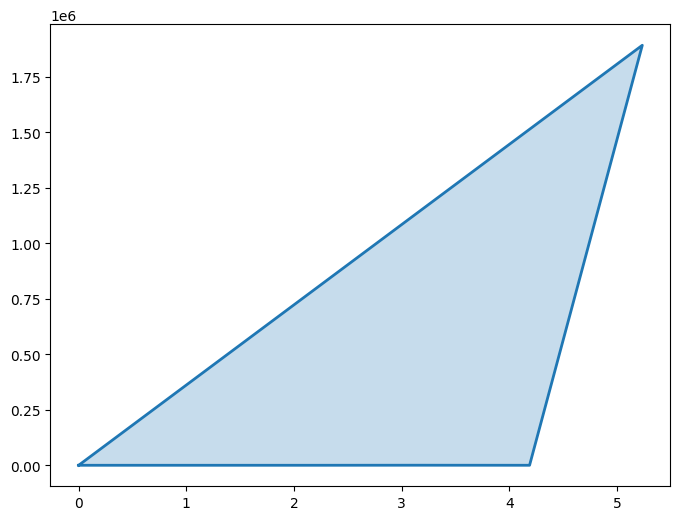

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# 需要的属性
attributes = ['FG_PCT', 'FG3_PCT', 'FT_PCT', 'PTS', 'AGE', 'year_salary']

# 计算每个簇的均值
cluster_means = df.groupby('cluster')[attributes].mean()

# -------- 雷达图绘制 --------
def plot_radar(stats_df, title, ax=None):
    # 设置雷达图的角度和标签
    labels = stats_df.columns
    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()

    # 创建一个雷达图
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 6), dpi=120, subplot_kw=dict(polar=True))

    # 雷达图的每个簇
    for cluster_idx in stats_df.index:
        stats = stats_df.loc[cluster_idx].tolist()
        
        # 完成一个循环（雷达图需要最后的点与第一个点连接）
        stats += stats[:1]
        angles += angles[:1]

        # 均值画图
        ax.plot(angles, stats, linewidth=2, label=f'Cluster {cluster_idx} - Mean')
        ax.fill(angles, stats, alpha=0.25)
    
    # 设置标签
    ax.set_yticklabels([])  # 去除雷达图的Y轴刻度
    ax.set_xticks(angles[:-1])  # 去掉最后一个角度
    ax.set_xticklabels(labels, fontsize=10, rotation=45)

    # 设置图标题
    ax.set_title(title, size=14, color='blue', y=1.1)
    return ax

# 设置子图
fig, axes = plt.subplots(1, 1, figsize=(8, 6))

# 均值雷达图
plot_radar(cluster_means, 'Radar Chart - Mean', axes)

# 添加图例
axes.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()


In [8]:
# 计算每个簇的统计特征
cluster_stats = df.groupby('cluster')[columns_for_clustering].agg(
    ['mean', 'min', 'max', 
     lambda x: x.quantile(0.25),  # 25% 分位数
     'median',                    # 50% 分位数（中位数）
     lambda x: x.quantile(0.75)   # 75% 分位数
])

# 打印计算出的统计特征
print("每个簇的统计特征：")
print(cluster_stats)


每个簇的统计特征：
                 GP                                               GS       \
               mean min  max <lambda_0> median <lambda_1>       mean  min   
cluster                                                                     
1         36.486173   1  110       19.0   36.0      52.00   4.749331  0.0   
2         68.299699  29   82       62.0   70.5      78.00  20.153614  0.0   
3         77.609948  42  168       71.0   79.0      81.75  59.376963  0.0   
4        107.200000  12  164       85.0  114.0     132.00  25.950000  0.0   
5         81.649910  35  170       73.0   79.0      82.00  67.317774  0.0   

                           ...   AGE                               \
           max <lambda_0>  ...   max <lambda_0> median <lambda_1>   
cluster                    ...                                      
1         82.0       0.00  ...  40.0       24.0   26.0       30.0   
2         82.0       5.00  ...  39.0       24.0   27.0       30.0   
3        148.0      46.25  .